# Training Custom ResNet
___

## Table of contents
1. [Imports](#Imports)
2. [LoadData](#LoadData)
3. [Config](#Configs)
4. [Analysis](#Analysis)
5. [Process](#Process)

## Imports

In [1]:
import os
import numpy as np
import pandas as pd

import optuna
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import Dataset,DataLoader,random_split
from torch.utils.tensorboard import SummaryWriter
import torchvision
from torchvision import models, transforms
from torch_lr_finder import LRFinder

from tqdm.notebook import tqdm

import math
import pretrainedmodels as ptm
import h5py
import copy
from datetime import datetime
import matplotlib.pyplot as plt

In [2]:
from Library.datasets import DatasetH5TwoRandom, DatasetH5ForTest, compute_std_mean
from Library.transforms import RandomFlip,RandomOffset,RandomRotateGrayscale
from Library.scheduler import OneCycleLR,LogLR
from Library.cresnet import initialize_cresnet
from Library.dml import RefBasedDeepMetric
from Library.models.FeatureExtractor import FeatureExtractor, Block, CustomNet
from Library.trainers import RefBasedDeepMetricTrainer

In [3]:
from Library.util import (
    jupyter_wide_screen,
    strings_contain_words, 
    strings_contain_patterns, 
    add_unique_entry
)

jupyter_wide_screen()

## LoadData

#### To initialize dataset: obtain References and Dataset object

In [4]:
def init_dataset(path,seq_idx_list,mean_val,std_val):

    ds_h5 = []
    refs_list = []

    img_transforms = [RandomRotateGrayscale(rot_range=[-0.1, 0.1], fill=150),                       
                      RandomFlip(lr_prob=0.5, ud_prob=0.5),
                      transforms.ToTensor(),
                      transforms.Normalize((mean_val,),(std_val,))]
    
    composed_img_transforms = transforms.Compose(img_transforms)
    
    # to obtain the Seq data
    for seq_idx in seq_idx_list:
        h5_fpath = path.format(seq_idx)
        h5_f = DatasetH5TwoRandom(h5_fpath, num_ref = 32, transform = composed_img_transforms)
        
        # obtain the references, the first 32 images in every Seq.
        refs = h5_f.getRef()
        refs_list.append(refs)
        
        ds_h5.append(h5_f)

    return refs_list, ds_h5

In [5]:
def init_dataloaders(datasets,ds_ratio):
    dataloaders = []
    
    for ds in datasets:
        splitted_ds_num_data = [round(len(ds) * ds_ratio[i]) for i in range(len(ds_ratio))]
        splitted_ds_num_data[0] += len(ds) - int(np.sum(splitted_ds_num_data))

        splitted_ds = []

        for tmp_ds, batch_size, shuffle in zip(random_split(ds, splitted_ds_num_data), batch_sizes, shuffle_flags):

            splitted_ds.append(
                DataLoader(
                    tmp_ds,
                    batch_size=batch_size,
                    shuffle=shuffle,
                    drop_last=True,
                )
            )

        dataloaders.append(splitted_ds)
    return dataloaders


## Load Data
### Config

#### Load 3 Stripes Data from /22008_1000202026_652510007

In [6]:
data_path_type1 = "../MA/NewData/22008_1000202026_652510007"
fnames_type1 = "regenerated_roi_ms1_seq{}_720x30.h5" # 2,3,4
combined_path_type1 = os.path.join(data_path_type1, fnames_type1)
seq_idx_list_type1 = [4,6,7,8]

#### Load 1 Stripe Data from /21503_1000200411_653340003 If need

In [ ]:
# type 2 Data New regenerated data
data_path_type2 = "../MA/NewData/21503_1000200411_653340003"
fnames_type2 = "regenerated_roi_ms1_seq{}_720x30.h5" # 2,3,4
combined_path_type2 = os.path.join(data_path_type2, fnames_type2)
seq_idx_list_type2 = [2,3,5,6]

In [7]:
inputs_shape = [1,720,30]
batch_sizes = [32, 32]
shuffle_flags = [True, False]
ds_ratio = [0.8, 0.2]

### Initialize datasets

In [8]:
# For 3 stripes data
mean_val = 0
std_val = 255
refs_list, ds_h5 = init_dataset(combined_path_type1, seq_idx_list_type1, mean_val, std_val)

In [9]:
len(refs_list)

4

In [ ]:
refs_list[0] = refs_list[2]
refs_list[1] = refs_list[2]

In [ ]:
refs_list[0][2] == refs_list[1][2]

### Initialize dataloaders

In [10]:
dataloaders = init_dataloaders(ds_h5, ds_ratio)
train_dls = [dls[0] for dls in dataloaders]
valid_dls = [dls[1] for dls in dataloaders]

In [11]:
ds_h5

In [12]:
len(refs_list)

4

In [13]:
refs_list[0].shape

torch.Size([32, 1, 720, 30])

In [14]:
print(len(ds_h5[0]))
print(len(ds_h5[1]))
print(len(ds_h5[2]))
print(len(ds_h5[3]))

6390
4759
4775
5309


## FeatureExtractor

In [15]:
class FeatureExtractor(nn.Module):
    # Custom feature extraction model from pretrained ResNet50

    def __init__(self, model,zero_init_residual=False):
        super(FeatureExtractor, self).__init__()
        
        self.conv1= nn.Conv2d(1, 64, 3, (2,1), 1)
        self.bn1 = model.bn1
        self.relu = nn.LeakyReLU()
        self.maxpool = model.maxpool

        self.layer1 = model.layer1
        self.layer2 = model.layer2

        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Sequential(nn.Linear(512, 128),
                                nn.Linear(128, 64))
                                
                
        # weights initialization
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, mode = 'fan_in', nonlinearity = 'leaky_relu')

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def forward(self, x):

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        self.featuremap0 = x.detach() # 核心代码

        x = self.layer1(x)
        self.featuremap1 = x.detach() # 核心代码
        
        x = self.layer2(x)
        self.featuremap2 = x.detach() # 核心代码
        
        x = self.avgpool(x)
        x = x.reshape(x.shape[0], -1)

        x = self.fc(x)
        self.featuremapfc = x.detach() # 核心代码
        
        # 使用的时候 : feature_output1 = model.featuremap1.transpose(1,0).cpu()
        
        return x
    
    def show_intermediate_shape(self, x):
        x = self.conv1(x)
        print("In conv1: ", x.shape)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        print("In maxpool: ", x.shape)
        x = self.layer1(x)
        print("In layer1: ", x.shape)
        x = self.layer2(x)
        print("In layer2: ", x.shape)
        
        x = self.avgpool(x)
        x = x.reshape(x.shape[0], -1)
        x = self.fc(x)
        print("In FC: ", x.shape)

## SiameseNet structure

In [16]:
class SiameseNet(nn.Module):
    def __init__(self, model):
        super(SiameseNet, self).__init__()
        self.model = model
        
    def _calculate_loss(self, v1, v2, refs_tensor):
        r"""Calculate distance between vector of img1&img2 and each reference images

        Args:
            v1 (Tensor, torch.Size[batchsize,128]): batch of img1s from feature extractor
            v2 (Tensor, torch.Size[batchsize,128]): batch of img2s from feature extractor
            refs_vectors(List of Tensor, torch.Size([1,128])): List of 10 refs vectors
        """
        v_dim = v1.size(1)
        num_ref = refs_tensor.size(0)

        v11 = v1.unsqueeze(1).repeat(1, num_ref, 1)
        v22 = v2.unsqueeze(1).repeat(1, num_ref, 1)
        refs = refs_tensor.unsqueeze(0).repeat(v1.size(0), 1, 1)  #v1.size(0) = batch size

        kernel_matrix1 = (v11-refs).pow(2).sum(2) #torch.Size([batchsize, 10])
        kernel_matrix2 = (v22-refs).pow(2).sum(2) #torch.Size([batchsize, 10])

        v1_distance_mean = torch.mean(kernel_matrix1,dim = 1) #torch.Size([batchsize])
        v2_distance_mean = torch.mean(kernel_matrix2,dim = 1) #torch.Size([batchsize])
        
        diff = v1_distance_mean - v2_distance_mean
        
        #print("Before Sigmoid outputs",outputs)
        sigmoid = nn.Sigmoid()
        outputs = sigmoid(diff)
        #print("After Sigmoid outputs",outputs)

        return outputs

    def forward(self, x1, x2, refs):
        v1 = self.model(x1)
        v2 = self.model(x2)
        feature_refs = self.model(refs)
        
        outputs = self._calculate_loss(v1, v2, feature_refs)
        return outputs
    
    # This function used to plot the degradation metric , x1 is the sequential image
    def forward_test(self, x1, refs):
        v1 = self.model(x1)
        feature_refs = self.model(refs)
        
        return v1, feature_refs
    
    def get_model(self, x):
        return self.model(x)



#### Load pretrained ResNet

In [17]:
res_model = models.resnet50(pretrained=True)
feature_extractor = FeatureExtractor(res_model)
model = RefBasedDeepMetric(feature_extractor,loss_non_linearity_name='sigmoid',criterion_name='bce',)
#model = SiameseNet(feature_extractor)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

RefBasedDeepMetric(
  (feature_extractor): FeatureExtractor(
    (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): LeakyReLU(negative_slope=0.01)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (down

In [ ]:
x = torch.randn(1,1,720,30)

model.model.show_intermediate_shape(x.to(device))

## Learning Rate Test

In [18]:
from torch.optim.lr_scheduler import _LRScheduler
from torch_lr_finder import LRFinder ,TrainDataLoaderIter, ValDataLoaderIter

In [19]:
class CustomTrainIter(TrainDataLoaderIter):
    def inputs_labels_from_batch(self, batch_data):
        img1, img2, labels = batch_data
        return img1, img2, labels
    
    def __next__(self):
        try:
            batch = next(self._iterator)
            img1, img2, labels = self.inputs_labels_from_batch(batch)
        except StopIteration:
            if not self.auto_reset:
                raise
            self._iterator = iter(self.data_loader)
            batch = next(self._iterator)
            img1, img2, labels = self.inputs_labels_from_batch(batch)

        return img1, img2, labels

In [20]:
class CustomValIter(ValDataLoaderIter):
    def inputs_labels_from_batch(self, batch_data):
        img1, img2, labels = batch_data
        return img1, img2, labels

In [21]:
class LinearLR(_LRScheduler):
    """Linearly increases the learning rate between two boundaries over a number of
    iterations.

    Arguments:
        optimizer (torch.optim.Optimizer): wrapped optimizer.
        end_lr (float): the final learning rate.
        num_iter (int): the number of iterations over which the test occurs.
        last_epoch (int, optional): the index of last epoch. Default: -1.
    """

    def __init__(self, optimizer, end_lr, num_iter, last_epoch=-1):
        self.end_lr = end_lr

        if num_iter <= 1:
            raise ValueError("`num_iter` must be larger than 1")
        self.num_iter = num_iter

        super(LinearLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        r = self.last_epoch / (self.num_iter - 1)

        return [base_lr + r * (self.end_lr - base_lr) for base_lr in self.base_lrs]

In [22]:
class ExponentialLR(_LRScheduler):
    """Exponentially increases the learning rate between two boundaries over a number of
    iterations.

    Arguments:
        optimizer (torch.optim.Optimizer): wrapped optimizer.
        end_lr (float): the final learning rate.
        num_iter (int): the number of iterations over which the test occurs.
        last_epoch (int, optional): the index of last epoch. Default: -1.
    """

    def __init__(self, optimizer, end_lr, num_iter, last_epoch=-1):
        self.end_lr = end_lr

        if num_iter <= 1:
            raise ValueError("`num_iter` must be larger than 1")
        self.num_iter = num_iter

        super(ExponentialLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        # In earlier Pytorch versions last_epoch starts at -1, while in recent versions
        # it starts at 0. We need to adjust the math a bit to handle this. See
        # discussion at: https://github.com/davidtvs/pytorch-lr-finder/pull/42
        
        r = self.last_epoch / (self.num_iter - 1)

        return [base_lr * (self.end_lr / base_lr) ** r for base_lr in self.base_lrs]

In [23]:
try:
    from apex import amp

    IS_AMP_AVAILABLE = True
except ImportError:
    IS_AMP_AVAILABLE = False
    
class CustomLRFinder(LRFinder):
    
    def custom_range_test(
        self,
        train_loader,
        curr_refs,
        val_loader=None,
        start_lr=None,
        end_lr=10,
        num_iter=100,
        step_mode="exp",
        smooth_f=0.05,
        diverge_th=5,
        accumulation_steps=1,
        non_blocking_transfer=True,
    ):
       
        # Reset test results
        self.history = {"lr": [], "loss": []}
        self.best_loss = None

        # Move the model to the proper device
        self.model.to(self.device)

        # Check if the optimizer is already attached to a scheduler
        self._check_for_scheduler()

        # Set the starting learning rate
        if start_lr:
            self._set_learning_rate(start_lr)

        # Initialize the proper learning rate policy
        if step_mode.lower() == "exp":
            lr_schedule = ExponentialLR(self.optimizer, end_lr, num_iter)
        elif step_mode.lower() == "linear":
            lr_schedule = LinearLR(self.optimizer, end_lr, num_iter)
        else:
            raise ValueError("expected one of (exp, linear), got {}".format(step_mode))

        if smooth_f < 0 or smooth_f >= 1:
            raise ValueError("smooth_f is outside the range [0, 1[")

        # Create an iterator to get data batch by batch
        if isinstance(train_loader, DataLoader):
            train_iter = TrainDataLoaderIter(train_loader)
        elif isinstance(train_loader, TrainDataLoaderIter):
            train_iter = train_loader
        else:
            raise ValueError(
                "`train_loader` has unsupported type: {}."
                "Expected types are `torch.utils.data.DataLoader`"
                "or child of `TrainDataLoaderIter`.".format(type(train_loader))
            )

        if val_loader:
            if isinstance(val_loader, DataLoader):
                val_iter = CustomValIter(val_loader)
            elif isinstance(val_loader, ValDataLoaderIter):
                val_iter = val_loader
            else:
                raise ValueError(
                    "`val_loader` has unsupported type: {}."
                    "Expected types are `torch.utils.data.DataLoader`"
                    "or child of `ValDataLoaderIter`.".format(type(val_loader))
                )

        for iteration in tqdm(range(num_iter)):
            # Train on batch and retrieve loss
            loss = self._train_batch(
                train_iter,
                curr_refs,
                accumulation_steps,
                non_blocking_transfer= non_blocking_transfer,
            )
            if val_loader:
                loss = self._validate(
                    val_iter, curr_refs, non_blocking_transfer=non_blocking_transfer
                )

            # Update the learning rate
            self.history["lr"].append(lr_schedule.get_lr()[0])
            lr_schedule.step()

            # Track the best loss and smooth it if smooth_f is specified
            if iteration == 0:
                self.best_loss = loss
            else:
                if smooth_f > 0:
                    loss = smooth_f * loss + (1 - smooth_f) * self.history["loss"][-1]
                if loss < self.best_loss:
                    self.best_loss = loss

            # Check if the loss has diverged; if it has, stop the test
            self.history["loss"].append(loss)
            if loss > diverge_th * self.best_loss:
                print("Stopping early, the loss has diverged")
                break

        print("Learning rate search finished. See the graph with {finder_name}.plot()")

    def _train_batch(self, train_iter, curr_refs, accumulation_steps, non_blocking_transfer=True):
        self.model.train()
        total_loss = None  # for late initialization
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.optimizer.zero_grad()
        curr_refs = curr_refs.float().to(device)

        for i in range(accumulation_steps):
            img1, img2, labels = next(train_iter)
            labels = labels.view(-1)
            labels = labels.to(device)
            img1 = img1.float().to(device)
            img2 = img2.float().to(device)

            # Forward pass
            loss, preds = self.model.compute_loss(img1, img2, curr_refs, labels)

            # Loss should be averaged in each step
            loss /= accumulation_steps

            # Backward pass
            if IS_AMP_AVAILABLE and hasattr(self.optimizer, "_amp_stash"):
                # For minor performance optimization, see also:
                # https://nvidia.github.io/apex/advanced.html#gradient-accumulation-across-iterations
                delay_unscale = ((i + 1) % accumulation_steps) != 0

                with amp.scale_loss(
                    loss, self.optimizer, delay_unscale=delay_unscale
                ) as scaled_loss:
                    scaled_loss.backward()
            else:
                loss.backward()

            if total_loss is None:
                total_loss = loss
            else:
                total_loss += loss

        self.optimizer.step()

        return total_loss.item()
    
    def _validate(self, val_iter, curr_refs, non_blocking_transfer=True):
        # Set model to evaluation mode and disable gradient computation
        running_loss = 0
        self.model.eval()
        
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        curr_refs = curr_refs.float().to(device)
        with torch.no_grad():
            for img1, img2, labels in val_iter:
                # Move data to the correct device
                labels = labels.view(-1)
                labels = labels.to(device)
                img1 = img1.float().to(device)
                img2 = img2.float().to(device)

                # Forward pass and loss computation
                loss, preds = self.model.compute_loss(img1, img2, curr_refs, labels)
                running_loss += loss.item() * len(labels)

        return running_loss / len(val_iter.dataset)
    

### LR Test Config

In [24]:
start_lr = 1e-8

min_lr_factor = 1e-1
anneal_lr_factor= 1e-1

train_dl_idx = 0
valid_dl_idx = 1
test_dl_idx = 2
refs_dl_idx = 0

optimizer = torch.optim.Adam(model.parameters(),lr=start_lr, eps=1e-08, weight_decay=0)
#optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=lr, momentum=0.5)
#criterion = nn.CrossEntropyLoss()
#criterion = nn.BCEWithLogitsLoss(reduction = 'none')
criterion = nn.BCELoss()


Learning rate search finished. See the graph with {finder_name}.plot()
LR suggestion: steepest gradient
Suggested LR: 1.85E-07


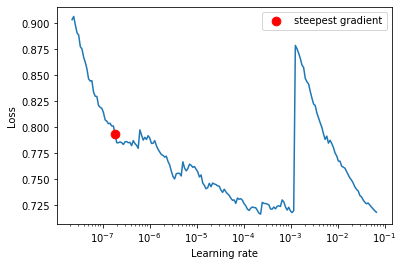

In [26]:
#lr_finder.reset()
lr_finder = CustomLRFinder(model, optimizer, criterion, device="cuda")

# seq dataloader / shuffel the dataloader
for refs, train_dl, val_dl in zip (refs_list, train_dls, valid_dls):
    custom_train_iter = CustomTrainIter(train_dl)
    custom_val_iter = CustomValIter(val_dl)
lr_finder.custom_range_test(custom_train_iter, curr_refs = refs, end_lr=0.1, num_iter=200)
lr_finder.plot()
lr_finder.reset()

## To see the intmediate feature

In [ ]:
feature_output1 = model.model.featuremap1.transpose(1,0).cpu()
feature_output2 = model.model.featuremap2.transpose(1,0).cpu()
#feature_output3 = model.model.featuremap3.transpose(1,0).cpu()
#feature_output4 = model.model.featuremap4.transpose(1,0).cpu()
#feature_output_fc = model.model.featuremapfc.transpose(1,0).cpu()
feature_output2.shape

In [ ]:
def feature_imshow(inp, title=None):
    
    """Imshow for Tensor."""
    
    inp = inp.detach().numpy().transpose((1, 2, 0))
    
    mean = np.array([0.5, 0.5, 0.5])
    
    std = np.array([0.5, 0.5, 0.5])
    
    inp = std * inp + mean
    
    inp = np.clip(inp, 0, 1)
    
    plt.imshow(inp)
    
    if title is not None:
        plt.title(title)
    
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
out = torchvision.utils.make_grid(feature_output1)
#feature_imshow(out)


## Training Config

In [27]:
num_epochs = 50

lr = 3e-05
min_lr_factor = 0.1
phases_ratio = [0.3, 0.2, 0.3, 0.2]

train_dl_idx = 0
valid_dl_idx = 1
test_dl_idx = 2

run_train = True

net_path = "../MA/save_net/"
criterion = nn.BCELoss()
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    
dateTimeObj = datetime.now()
timestampStr = dateTimeObj.strftime("%d-%b-%Y (%H:%M:%S)")
print('Current Timestamp : ', timestampStr)

Current Timestamp :  18-May-2021 (00:18:11)


### Train

Total Train Iterations:  460
Total Train Iterations List:  [115, 230, 345, 460]
[38, 38, 39, 38]


Train



Sequence:1, Seq Training Mean Loss: 0.7368457478025685, Seq Training Acc: 0.4747282608695652
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.7095137274783591, Seq Training Acc: 0.5070652173913044
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6918989549512449, Seq Training Acc: 0.5410326086956522
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.7003544190655584, Seq Training Acc: 0.5065217391304347
******************************************************************
Epoch:1, Epoch Training Loss Mean: 0.7096532583236694, Epoch Acc: 0.6764492753623188
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7038571003236269, Seq Val Acc: 0.48930921052631576



******************************************************************
Sequence:2, Seq Mean Loss: 0.6874811994402033, Seq Val Acc: 0.5427631578947368



******************************************************************
Sequence:3, Seq Mean Loss: 0.6872372520275605, Seq Val Acc: 0.5568910256410257



******************************************************************
Sequence:4, Seq Mean Loss: 0.6928070171883232, Seq Val Acc: 0.5320723684210527
Epoch:1, Epoch Val Mean Loss: 0.692808985710144, Epoch Val Acc: 0.7118969298245614
******************************************************************


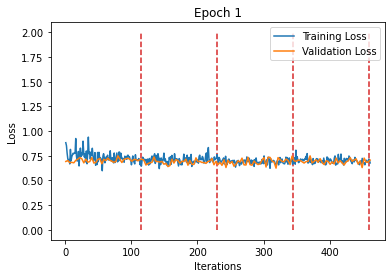

Train



Sequence:1, Seq Training Mean Loss: 0.6978324138599893, Seq Training Acc: 0.5111413043478261
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.6899626607480256, Seq Training Acc: 0.5372282608695652
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6726847985516424, Seq Training Acc: 0.5855978260869565
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6983147061389425, Seq Training Acc: 0.5119565217391304
******************************************************************
Epoch:2, Epoch Training Loss Mean: 0.6896986365318298, Epoch Acc: 0.7153079710144927
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7064756421666396, Seq Val Acc: 0.48519736842105265



******************************************************************
Sequence:2, Seq Mean Loss: 0.6868228143767307, Seq Val Acc: 0.5616776315789473



******************************************************************
Sequence:3, Seq Mean Loss: 0.666237507110987, Seq Val Acc: 0.5993589743589743



******************************************************************
Sequence:4, Seq Mean Loss: 0.680038205887142, Seq Val Acc: 0.5526315789473685
Epoch:2, Epoch Val Mean Loss: 0.6847715973854065, Epoch Val Acc: 0.7382127192982456
******************************************************************


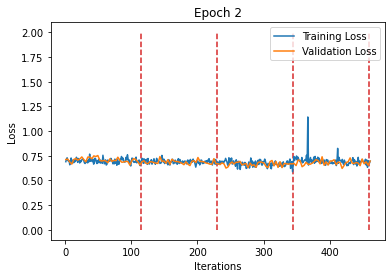

Train



Sequence:1, Seq Training Mean Loss: 0.6958862900733948, Seq Training Acc: 0.5078804347826087
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.6905036133268605, Seq Training Acc: 0.525
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6409195511237434, Seq Training Acc: 0.6510869565217391
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6894774659820225, Seq Training Acc: 0.5551630434782608
******************************************************************
Epoch:3, Epoch Training Loss Mean: 0.6791967153549194, Epoch Acc: 0.7463768115942029
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6951146172849756, Seq Val Acc: 0.5148026315789473



******************************************************************
Sequence:2, Seq Mean Loss: 0.6753632567430797, Seq Val Acc: 0.5822368421052632



******************************************************************
Sequence:3, Seq Mean Loss: 0.6099783717057644, Seq Val Acc: 0.6850961538461539



******************************************************************
Sequence:4, Seq Mean Loss: 0.6700952445205889, Seq Val Acc: 0.5962171052631579
Epoch:3, Epoch Val Mean Loss: 0.6622936725616455, Epoch Val Acc: 0.7987938596491229
******************************************************************


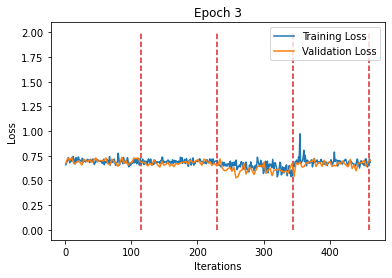

Train



Sequence:1, Seq Training Mean Loss: 0.6889725695485654, Seq Training Acc: 0.5239130434782608
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.6788059167239977, Seq Training Acc: 0.5701086956521739
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.5663025280703669, Seq Training Acc: 0.710054347826087
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6831353368966476, Seq Training Acc: 0.5671195652173913
******************************************************************
Epoch:4, Epoch Training Loss Mean: 0.654304027557373, Epoch Acc: 0.7903985507246377
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6972650509131583, Seq Val Acc: 0.5213815789473685



******************************************************************
Sequence:2, Seq Mean Loss: 0.6779183698327917, Seq Val Acc: 0.578125



******************************************************************
Sequence:3, Seq Mean Loss: 0.5564060715528635, Seq Val Acc: 0.7347756410256411



******************************************************************
Sequence:4, Seq Mean Loss: 0.6533404384788714, Seq Val Acc: 0.6200657894736842
Epoch:4, Epoch Val Mean Loss: 0.6456453800201416, Epoch Val Acc: 0.8245614035087719
******************************************************************


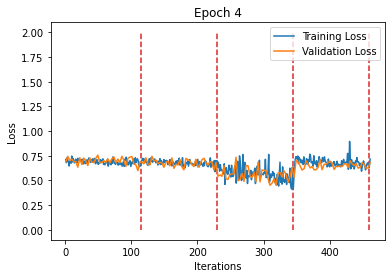

Train



Sequence:1, Seq Training Mean Loss: 0.6896417400111323, Seq Training Acc: 0.5456521739130434
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.6707069200018178, Seq Training Acc: 0.5910326086956522
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.5179314304953037, Seq Training Acc: 0.7391304347826086
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6661780502485193, Seq Training Acc: 0.595108695652174
******************************************************************
Epoch:5, Epoch Training Loss Mean: 0.6361144781112671, Epoch Acc: 0.8236413043478261
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7071955643202129, Seq Val Acc: 0.5172697368421053



******************************************************************
Sequence:2, Seq Mean Loss: 0.7016129195690155, Seq Val Acc: 0.5592105263157895



******************************************************************
Sequence:3, Seq Mean Loss: 0.5707757411858975, Seq Val Acc: 0.7075320512820513



******************************************************************
Sequence:4, Seq Mean Loss: 0.6441620651044344, Seq Val Acc: 0.6373355263157895
Epoch:5, Epoch Val Mean Loss: 0.6553799510002136, Epoch Val Acc: 0.8133223684210527
******************************************************************


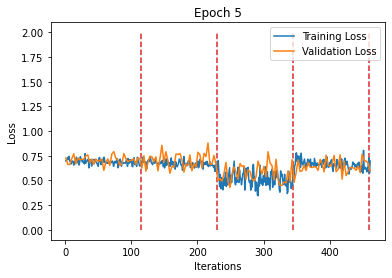

Train



Sequence:1, Seq Training Mean Loss: 0.6910590674566186, Seq Training Acc: 0.5285326086956522
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.6453593124514041, Seq Training Acc: 0.6233695652173913
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.5044411560763483, Seq Training Acc: 0.7614130434782609
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6391891349916873, Seq Training Acc: 0.6402173913043478
******************************************************************
Epoch:6, Epoch Training Loss Mean: 0.620012104511261, Epoch Acc: 0.8511775362318841
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.702015818733918, Seq Val Acc: 0.522203947368421



******************************************************************
Sequence:2, Seq Mean Loss: 0.6836007190378088, Seq Val Acc: 0.6011513157894737



******************************************************************
Sequence:3, Seq Mean Loss: 0.5638025150849268, Seq Val Acc: 0.7243589743589743



******************************************************************
Sequence:4, Seq Mean Loss: 0.5868402256777412, Seq Val Acc: 0.696546052631579
Epoch:6, Epoch Val Mean Loss: 0.6336055994033813, Epoch Val Acc: 0.8544407894736842
******************************************************************


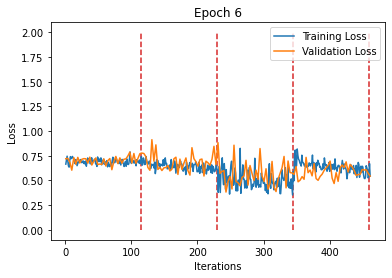

Train



Sequence:1, Seq Training Mean Loss: 0.6911038875579834, Seq Training Acc: 0.54375
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.6316206268642259, Seq Training Acc: 0.6472826086956521
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4954885449098504, Seq Training Acc: 0.7701086956521739
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.61387147333311, Seq Training Acc: 0.6817934782608696
******************************************************************
Epoch:7, Epoch Training Loss Mean: 0.6080211400985718, Epoch Acc: 0.8809782608695652
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7095429191463872, Seq Val Acc: 0.5345394736842105



******************************************************************
Sequence:2, Seq Mean Loss: 0.6778280970297361, Seq Val Acc: 0.6299342105263158



******************************************************************
Sequence:3, Seq Mean Loss: 0.6579144642903254, Seq Val Acc: 0.7099358974358975



******************************************************************
Sequence:4, Seq Mean Loss: 0.5378955163453755, Seq Val Acc: 0.7442434210526315
Epoch:7, Epoch Val Mean Loss: 0.6458745002746582, Epoch Val Acc: 0.8791118421052632
******************************************************************


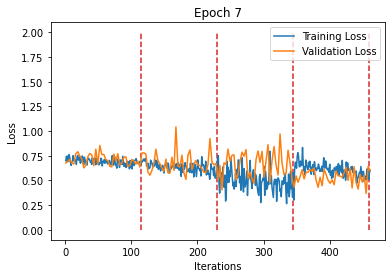

Train



Sequence:1, Seq Training Mean Loss: 0.6875850672307222, Seq Training Acc: 0.5551630434782608
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.6053351399691208, Seq Training Acc: 0.6790760869565218
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.46710149516230043, Seq Training Acc: 0.7771739130434783
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.604796908731046, Seq Training Acc: 0.691304347826087
******************************************************************
Epoch:8, Epoch Training Loss Mean: 0.5912046432495117, Epoch Acc: 0.9009057971014492
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7119724828945962, Seq Val Acc: 0.5649671052631579



******************************************************************
Sequence:2, Seq Mean Loss: 0.7587040364742279, Seq Val Acc: 0.5682565789473685



******************************************************************
Sequence:3, Seq Mean Loss: 0.6972027841286782, Seq Val Acc: 0.6971153846153846



******************************************************************
Sequence:4, Seq Mean Loss: 0.5314087373645682, Seq Val Acc: 0.7327302631578947
Epoch:8, Epoch Val Mean Loss: 0.6749683618545532, Epoch Val Acc: 0.8604714912280702
******************************************************************


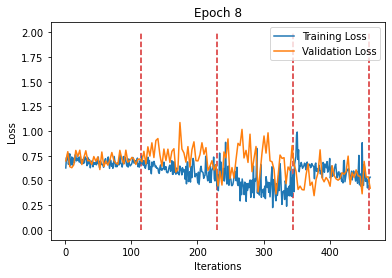

Train



Sequence:1, Seq Training Mean Loss: 0.6866173961888189, Seq Training Acc: 0.5633152173913043
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5895901874355648, Seq Training Acc: 0.6866847826086957
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4621751445790996, Seq Training Acc: 0.7866847826086957
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.562073874991873, Seq Training Acc: 0.7119565217391305
******************************************************************
Epoch:9, Epoch Training Loss Mean: 0.5751141905784607, Epoch Acc: 0.916213768115942
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7258670094766115, Seq Val Acc: 0.5419407894736842



******************************************************************
Sequence:2, Seq Mean Loss: 0.7387199260686573, Seq Val Acc: 0.5822368421052632



******************************************************************
Sequence:3, Seq Mean Loss: 0.6254326273233463, Seq Val Acc: 0.7011217948717948



******************************************************************
Sequence:4, Seq Mean Loss: 0.48494779985201986, Seq Val Acc: 0.7730263157894737
Epoch:9, Epoch Val Mean Loss: 0.6436222195625305, Epoch Val Acc: 0.8722587719298246
******************************************************************


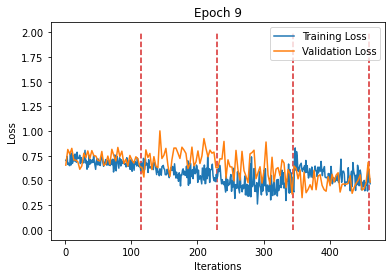

Train



Sequence:1, Seq Training Mean Loss: 0.6860403340795765, Seq Training Acc: 0.5703804347826087
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5618965949701227, Seq Training Acc: 0.7228260869565217
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.47964996358622675, Seq Training Acc: 0.7744565217391305
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.538244326736616, Seq Training Acc: 0.7361413043478261
******************************************************************
Epoch:10, Epoch Training Loss Mean: 0.5664578080177307, Epoch Acc: 0.9346014492753624
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7135753255141409, Seq Val Acc: 0.5509868421052632



******************************************************************
Sequence:2, Seq Mean Loss: 0.6841265229802382, Seq Val Acc: 0.6282894736842105



******************************************************************
Sequence:3, Seq Mean Loss: 0.5760577152936887, Seq Val Acc: 0.7299679487179487



******************************************************************
Sequence:4, Seq Mean Loss: 0.49998565253458527, Seq Val Acc: 0.7475328947368421
Epoch:10, Epoch Val Mean Loss: 0.618159294128418, Epoch Val Acc: 0.8919956140350878
******************************************************************


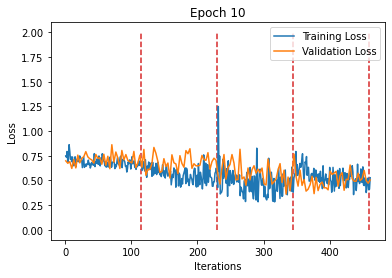

Train



Sequence:1, Seq Training Mean Loss: 0.6827072620391845, Seq Training Acc: 0.5695652173913044
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5592217466105586, Seq Training Acc: 0.7239130434782609
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4581612835759702, Seq Training Acc: 0.7910326086956522
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.5209017872810364, Seq Training Acc: 0.7415760869565218
******************************************************************
Epoch:11, Epoch Training Loss Mean: 0.5552480220794678, Epoch Acc: 0.9420289855072463
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7061270804781663, Seq Val Acc: 0.553453947368421



******************************************************************
Sequence:2, Seq Mean Loss: 0.6562382257298419, Seq Val Acc: 0.6480263157894737



******************************************************************
Sequence:3, Seq Mean Loss: 0.5314120703782791, Seq Val Acc: 0.7347756410256411



******************************************************************
Sequence:4, Seq Mean Loss: 0.47372743330503764, Seq Val Acc: 0.7697368421052632
Epoch:11, Epoch Val Mean Loss: 0.5914810299873352, Epoch Val Acc: 0.9084429824561403
******************************************************************


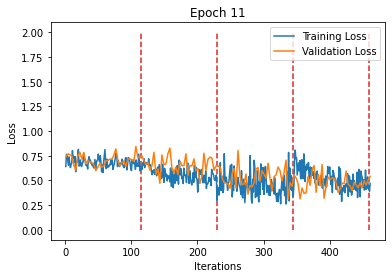

Train



Sequence:1, Seq Training Mean Loss: 0.6735728875450466, Seq Training Acc: 0.5942934782608695
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.558021677058676, Seq Training Acc: 0.7206521739130435
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.45795733475166817, Seq Training Acc: 0.7823369565217392
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.500786608716716, Seq Training Acc: 0.7611413043478261
******************************************************************
Epoch:12, Epoch Training Loss Mean: 0.5475846529006958, Epoch Acc: 0.9528079710144928
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.719308487678829, Seq Val Acc: 0.5131578947368421



******************************************************************
Sequence:2, Seq Mean Loss: 0.6819147185275429, Seq Val Acc: 0.6208881578947368



******************************************************************
Sequence:3, Seq Mean Loss: 0.5785955496323414, Seq Val Acc: 0.7291666666666666



******************************************************************
Sequence:4, Seq Mean Loss: 0.4350060765680514, Seq Val Acc: 0.8125
Epoch:12, Epoch Val Mean Loss: 0.6035420298576355, Epoch Val Acc: 0.8983004385964912
******************************************************************


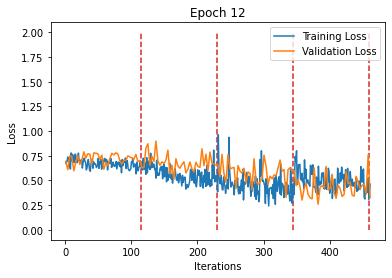

Train



Sequence:1, Seq Training Mean Loss: 0.6686689532321433, Seq Training Acc: 0.6002717391304347
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.556636826629224, Seq Training Acc: 0.7209239130434782
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4229806796364162, Seq Training Acc: 0.8016304347826086
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4824435026749321, Seq Training Acc: 0.7690217391304348
******************************************************************
Epoch:13, Epoch Training Loss Mean: 0.532682478427887, Epoch Acc: 0.9639492753623189
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7048653505350414, Seq Val Acc: 0.5633223684210527



******************************************************************
Sequence:2, Seq Mean Loss: 0.7054349976150613, Seq Val Acc: 0.602796052631579



******************************************************************
Sequence:3, Seq Mean Loss: 0.5600584011811477, Seq Val Acc: 0.7291666666666666



******************************************************************
Sequence:4, Seq Mean Loss: 0.45713193400910024, Seq Val Acc: 0.78125
Epoch:13, Epoch Val Mean Loss: 0.6065666675567627, Epoch Val Acc: 0.8985745614035088
******************************************************************


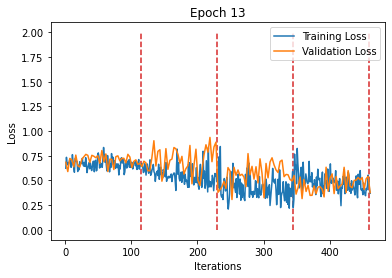

Train



Sequence:1, Seq Training Mean Loss: 0.6624861328498177, Seq Training Acc: 0.6144021739130435
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.542348202155984, Seq Training Acc: 0.7328804347826087
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4247022469406543, Seq Training Acc: 0.810054347826087
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4689583542554275, Seq Training Acc: 0.7741847826086956
******************************************************************
Epoch:14, Epoch Training Loss Mean: 0.524623692035675, Epoch Acc: 0.9771739130434782
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7003036659014853, Seq Val Acc: 0.5550986842105263



******************************************************************
Sequence:2, Seq Mean Loss: 0.6157373284038744, Seq Val Acc: 0.6504934210526315



******************************************************************
Sequence:3, Seq Mean Loss: 0.48965885165410167, Seq Val Acc: 0.7684294871794872



******************************************************************
Sequence:4, Seq Mean Loss: 0.46819987187260076, Seq Val Acc: 0.7787828947368421
Epoch:14, Epoch Val Mean Loss: 0.5679598450660706, Epoch Val Acc: 0.9243421052631579
******************************************************************


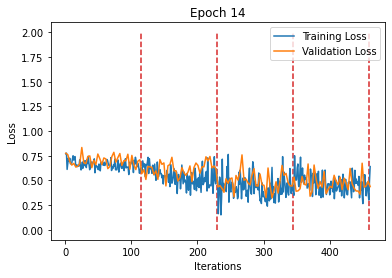

Train



Sequence:1, Seq Training Mean Loss: 0.6637865740319957, Seq Training Acc: 0.6114130434782609
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5264462483965833, Seq Training Acc: 0.7451086956521739
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.43571766744489254, Seq Training Acc: 0.8040760869565218
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4329434651395549, Seq Training Acc: 0.8016304347826086
******************************************************************
Epoch:15, Epoch Training Loss Mean: 0.5147234797477722, Epoch Acc: 0.9874094202898551
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.686142866548739, Seq Val Acc: 0.5773026315789473



******************************************************************
Sequence:2, Seq Mean Loss: 0.6702348009536141, Seq Val Acc: 0.6365131578947368



******************************************************************
Sequence:3, Seq Mean Loss: 0.5431516208709815, Seq Val Acc: 0.7419871794871795



******************************************************************
Sequence:4, Seq Mean Loss: 0.48002564593365316, Seq Val Acc: 0.7738486842105263
Epoch:15, Epoch Val Mean Loss: 0.594550609588623, Epoch Val Acc: 0.9163925438596491
******************************************************************


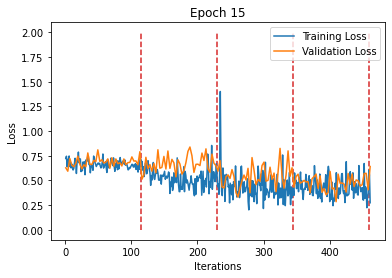

Train



Sequence:1, Seq Training Mean Loss: 0.6588761930880339, Seq Training Acc: 0.6097826086956522
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5271628929221112, Seq Training Acc: 0.7453804347826087
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4296798269385877, Seq Training Acc: 0.8
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4473808526992798, Seq Training Acc: 0.7896739130434782
******************************************************************
Epoch:16, Epoch Training Loss Mean: 0.5157749056816101, Epoch Acc: 0.9816123188405798
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.7016974373867637, Seq Val Acc: 0.5773026315789473



******************************************************************
Sequence:2, Seq Mean Loss: 0.6477517297393397, Seq Val Acc: 0.6414473684210527



******************************************************************
Sequence:3, Seq Mean Loss: 0.5325659268941635, Seq Val Acc: 0.7379807692307693



******************************************************************
Sequence:4, Seq Mean Loss: 0.43365086066095454, Seq Val Acc: 0.7861842105263158
Epoch:16, Epoch Val Mean Loss: 0.5786135792732239, Epoch Val Acc: 0.9207785087719298
******************************************************************


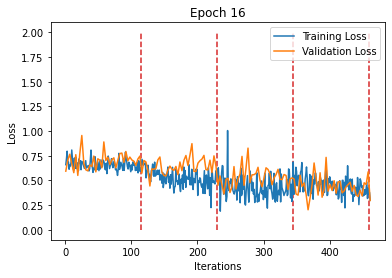

Train



Sequence:1, Seq Training Mean Loss: 0.6580722484899604, Seq Training Acc: 0.6103260869565217
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5137475000775379, Seq Training Acc: 0.7467391304347826
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3893872128880542, Seq Training Acc: 0.8192934782608695
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.41593950494475984, Seq Training Acc: 0.8070652173913043
******************************************************************
Epoch:17, Epoch Training Loss Mean: 0.4942866265773773, Epoch Acc: 0.9944746376811594
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6777904284627814, Seq Val Acc: 0.584703947368421



******************************************************************
Sequence:2, Seq Mean Loss: 0.6702157729550412, Seq Val Acc: 0.6398026315789473



******************************************************************
Sequence:3, Seq Mean Loss: 0.5485454293397757, Seq Val Acc: 0.7315705128205128



******************************************************************
Sequence:4, Seq Mean Loss: 0.3940974246514471, Seq Val Acc: 0.8223684210526315
Epoch:17, Epoch Val Mean Loss: 0.5725046396255493, Epoch Val Acc: 0.9325657894736842
******************************************************************


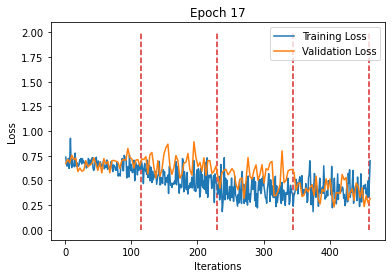

Train



Sequence:1, Seq Training Mean Loss: 0.6441600900629293, Seq Training Acc: 0.6334239130434782
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5296418633150017, Seq Training Acc: 0.7380434782608696
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4230974985205609, Seq Training Acc: 0.8059782608695653
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.40849078245784926, Seq Training Acc: 0.8089673913043478
******************************************************************
Epoch:18, Epoch Training Loss Mean: 0.501347541809082, Epoch Acc: 0.9954710144927537
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6779570548157943, Seq Val Acc: 0.609375



******************************************************************
Sequence:2, Seq Mean Loss: 0.6348144153231069, Seq Val Acc: 0.640625



******************************************************************
Sequence:3, Seq Mean Loss: 0.5447863989915603, Seq Val Acc: 0.7604166666666666



******************************************************************
Sequence:4, Seq Mean Loss: 0.4632545176305269, Seq Val Acc: 0.7952302631578947
Epoch:18, Epoch Val Mean Loss: 0.5799716114997864, Epoch Val Acc: 0.9418859649122807
******************************************************************


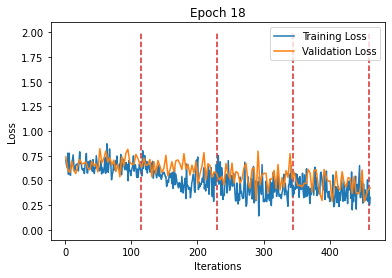

Train



Sequence:1, Seq Training Mean Loss: 0.636555046102275, Seq Training Acc: 0.6372282608695652
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5060741694077201, Seq Training Acc: 0.7521739130434782
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4165904476590779, Seq Training Acc: 0.8054347826086956
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4136686992386113, Seq Training Acc: 0.8067934782608696
******************************************************************
Epoch:19, Epoch Training Loss Mean: 0.49322208762168884, Epoch Acc: 1.0005434782608695
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6613886889658476, Seq Val Acc: 0.5953947368421053



******************************************************************
Sequence:2, Seq Mean Loss: 0.6404635294487602, Seq Val Acc: 0.6488486842105263



******************************************************************
Sequence:3, Seq Mean Loss: 0.506020500873908, Seq Val Acc: 0.7652243589743589



******************************************************************
Sequence:4, Seq Mean Loss: 0.41493069733444016, Seq Val Acc: 0.821546052631579
Epoch:19, Epoch Val Mean Loss: 0.5553761124610901, Epoch Val Acc: 0.9503837719298246
******************************************************************


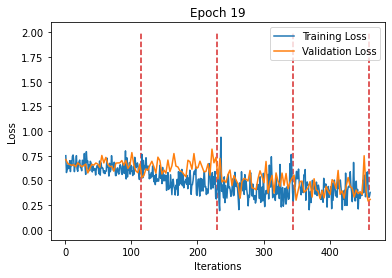

Train



Sequence:1, Seq Training Mean Loss: 0.6315166983915412, Seq Training Acc: 0.6426630434782609
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.514293583838836, Seq Training Acc: 0.7494565217391305
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4153812789398691, Seq Training Acc: 0.8160326086956522
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.40686109869376474, Seq Training Acc: 0.8168478260869565
******************************************************************
Epoch:20, Epoch Training Loss Mean: 0.49201318621635437, Epoch Acc: 1.0083333333333333
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6623183206508034, Seq Val Acc: 0.602796052631579



******************************************************************
Sequence:2, Seq Mean Loss: 0.6279271652824, Seq Val Acc: 0.6743421052631579



******************************************************************
Sequence:3, Seq Mean Loss: 0.5302281081676483, Seq Val Acc: 0.7403846153846154



******************************************************************
Sequence:4, Seq Mean Loss: 0.41832681117873444, Seq Val Acc: 0.819078947368421
Epoch:20, Epoch Val Mean Loss: 0.559507429599762, Epoch Val Acc: 0.9520285087719298
******************************************************************


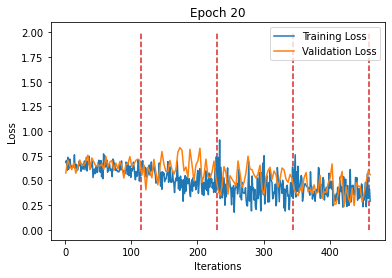

Train



Sequence:1, Seq Training Mean Loss: 0.6328451794126759, Seq Training Acc: 0.652445652173913
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.48956641321596894, Seq Training Acc: 0.7576086956521739
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.41151164614635966, Seq Training Acc: 0.8157608695652174
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3928142988163492, Seq Training Acc: 0.8141304347826087
******************************************************************
Epoch:21, Epoch Training Loss Mean: 0.4816844165325165, Epoch Acc: 1.0133152173913043
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6481648440423765, Seq Val Acc: 0.609375



******************************************************************
Sequence:2, Seq Mean Loss: 0.6631396836356113, Seq Val Acc: 0.6151315789473685



******************************************************************
Sequence:3, Seq Mean Loss: 0.47665186188159847, Seq Val Acc: 0.7756410256410257



******************************************************************
Sequence:4, Seq Mean Loss: 0.36206896681534617, Seq Val Acc: 0.8289473684210527
Epoch:21, Epoch Val Mean Loss: 0.5371086001396179, Epoch Val Acc: 0.9498355263157895
******************************************************************


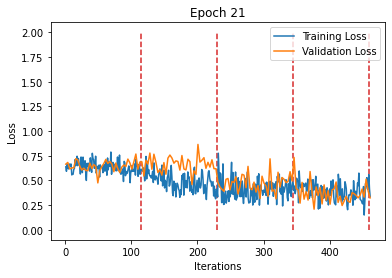

Train



Sequence:1, Seq Training Mean Loss: 0.6126613907192064, Seq Training Acc: 0.6660326086956522
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.48669889310131903, Seq Training Acc: 0.7657608695652174
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.41888997645481774, Seq Training Acc: 0.810054347826087
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.38092460126980493, Seq Training Acc: 0.8285326086956522
******************************************************************
Epoch:22, Epoch Training Loss Mean: 0.4747937023639679, Epoch Acc: 1.0234601449275362
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6494472418960772, Seq Val Acc: 0.6332236842105263



******************************************************************
Sequence:2, Seq Mean Loss: 0.600098015446412, Seq Val Acc: 0.6800986842105263



******************************************************************
Sequence:3, Seq Mean Loss: 0.5141932933758466, Seq Val Acc: 0.750801282051282



******************************************************************
Sequence:4, Seq Mean Loss: 0.40302681687631103, Seq Val Acc: 0.8174342105263158
Epoch:22, Epoch Val Mean Loss: 0.541511595249176, Epoch Val Acc: 0.9671052631578947
******************************************************************


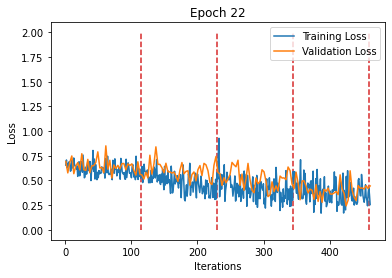

Train



Sequence:1, Seq Training Mean Loss: 0.6142566691274228, Seq Training Acc: 0.6619565217391304
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4882090221280637, Seq Training Acc: 0.7649456521739131
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.409047348862109, Seq Training Acc: 0.816304347826087
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3775714227038881, Seq Training Acc: 0.8309782608695652
******************************************************************
Epoch:23, Epoch Training Loss Mean: 0.4722711443901062, Epoch Acc: 1.0247282608695651
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6624620054897509, Seq Val Acc: 0.6167763157894737



******************************************************************
Sequence:2, Seq Mean Loss: 0.6493245175010279, Seq Val Acc: 0.647203947368421



******************************************************************
Sequence:3, Seq Mean Loss: 0.5356323291093875, Seq Val Acc: 0.7371794871794872



******************************************************************
Sequence:4, Seq Mean Loss: 0.3754967839310044, Seq Val Acc: 0.821546052631579
Epoch:23, Epoch Val Mean Loss: 0.5555975437164307, Epoch Val Acc: 0.9473684210526315
******************************************************************


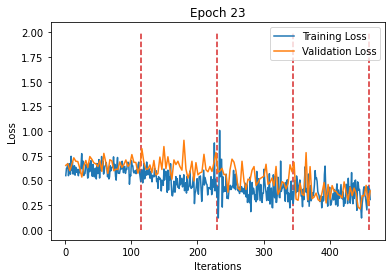

Train



Sequence:1, Seq Training Mean Loss: 0.616387017654336, Seq Training Acc: 0.6644021739130435
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.48322297619736715, Seq Training Acc: 0.7657608695652174
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.38574871641138325, Seq Training Acc: 0.8301630434782609
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.378953924515973, Seq Training Acc: 0.8282608695652174
******************************************************************
Epoch:24, Epoch Training Loss Mean: 0.46607816219329834, Epoch Acc: 1.0295289855072465
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6395074693780196, Seq Val Acc: 0.6348684210526315



******************************************************************
Sequence:2, Seq Mean Loss: 0.5901237898751309, Seq Val Acc: 0.6759868421052632



******************************************************************
Sequence:3, Seq Mean Loss: 0.46617726332102066, Seq Val Acc: 0.7868589743589743



******************************************************************
Sequence:4, Seq Mean Loss: 0.4192839821702556, Seq Val Acc: 0.8026315789473685
Epoch:24, Epoch Val Mean Loss: 0.5283640027046204, Epoch Val Acc: 0.9736842105263158
******************************************************************


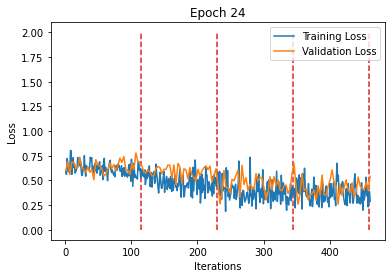

Train



Sequence:1, Seq Training Mean Loss: 0.5999078963113867, Seq Training Acc: 0.6747282608695652
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4928052150684854, Seq Training Acc: 0.7614130434782609
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3778404247501622, Seq Training Acc: 0.8252717391304348
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.36175868290921914, Seq Training Acc: 0.8396739130434783
******************************************************************
Epoch:25, Epoch Training Loss Mean: 0.4580780267715454, Epoch Acc: 1.0336956521739131
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6243933282400432, Seq Val Acc: 0.6546052631578947



******************************************************************
Sequence:2, Seq Mean Loss: 0.608435089650907, Seq Val Acc: 0.6644736842105263



******************************************************************
Sequence:3, Seq Mean Loss: 0.47405961003058994, Seq Val Acc: 0.7828525641025641



******************************************************************
Sequence:4, Seq Mean Loss: 0.3868063103995825, Seq Val Acc: 0.8355263157894737
Epoch:25, Epoch Val Mean Loss: 0.5231009721755981, Epoch Val Acc: 0.9860197368421053
******************************************************************


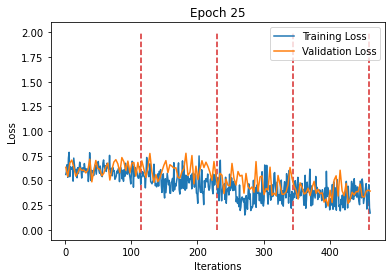

Train



Sequence:1, Seq Training Mean Loss: 0.603607005658357, Seq Training Acc: 0.6823369565217391
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4758639403011488, Seq Training Acc: 0.7728260869565218
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.37787782549858095, Seq Training Acc: 0.83125
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.36141103648621103, Seq Training Acc: 0.8255434782608696
******************************************************************
Epoch:26, Epoch Training Loss Mean: 0.45468994975090027, Epoch Acc: 1.0373188405797102
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6183522202466664, Seq Val Acc: 0.6669407894736842



******************************************************************
Sequence:2, Seq Mean Loss: 0.5931148129074197, Seq Val Acc: 0.6833881578947368



******************************************************************
Sequence:3, Seq Mean Loss: 0.5065280023293618, Seq Val Acc: 0.7676282051282052



******************************************************************
Sequence:4, Seq Mean Loss: 0.38187970103401886, Seq Val Acc: 0.8264802631578947
Epoch:26, Epoch Val Mean Loss: 0.5248481631278992, Epoch Val Acc: 0.9882127192982456
******************************************************************


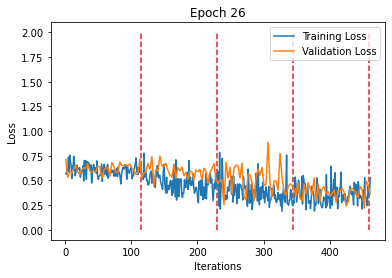

Train



Sequence:1, Seq Training Mean Loss: 0.5987676972928254, Seq Training Acc: 0.6796195652173913
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4676633746727653, Seq Training Acc: 0.7809782608695652
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3889329038236452, Seq Training Acc: 0.8336956521739131
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.35652924387351326, Seq Training Acc: 0.8410326086956522
******************************************************************
Epoch:27, Epoch Training Loss Mean: 0.45297330617904663, Epoch Acc: 1.045108695652174
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6228603218731127, Seq Val Acc: 0.6661184210526315



******************************************************************
Sequence:2, Seq Mean Loss: 0.5879179207902205, Seq Val Acc: 0.6891447368421053



******************************************************************
Sequence:3, Seq Mean Loss: 0.4780826836060255, Seq Val Acc: 0.7852564102564102



******************************************************************
Sequence:4, Seq Mean Loss: 0.4147119698555846, Seq Val Acc: 0.8100328947368421
Epoch:27, Epoch Val Mean Loss: 0.5255807042121887, Epoch Val Acc: 0.9904057017543859
******************************************************************


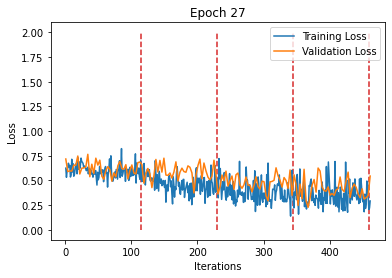

Train



Sequence:1, Seq Training Mean Loss: 0.5854425539141116, Seq Training Acc: 0.6923913043478261
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.46845060379608816, Seq Training Acc: 0.7736413043478261
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.38265824395677317, Seq Training Acc: 0.8296195652173913
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3607880087002464, Seq Training Acc: 0.8377717391304348
******************************************************************
Epoch:28, Epoch Training Loss Mean: 0.44933485984802246, Epoch Acc: 1.0444746376811593
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5979177685160386, Seq Val Acc: 0.6850328947368421



******************************************************************
Sequence:2, Seq Mean Loss: 0.5893737971782684, Seq Val Acc: 0.6891447368421053



******************************************************************
Sequence:3, Seq Mean Loss: 0.48249336007313853, Seq Val Acc: 0.7780448717948718



******************************************************************
Sequence:4, Seq Mean Loss: 0.3557528108358383, Seq Val Acc: 0.8495065789473685
Epoch:28, Epoch Val Mean Loss: 0.5062282681465149, Epoch Val Acc: 1.0074013157894737
******************************************************************


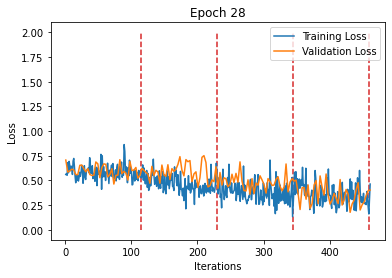

Train



Sequence:1, Seq Training Mean Loss: 0.5885108745616415, Seq Training Acc: 0.6910326086956522
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4503955673912297, Seq Training Acc: 0.7894021739130435
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.37614654380342233, Seq Training Acc: 0.8364130434782608
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.34506562896396803, Seq Training Acc: 0.8467391304347827
******************************************************************
Epoch:29, Epoch Training Loss Mean: 0.44002965092658997, Epoch Acc: 1.0545289855072464
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6047618522455818, Seq Val Acc: 0.6735197368421053



******************************************************************
Sequence:2, Seq Mean Loss: 0.5891303992585132, Seq Val Acc: 0.6899671052631579



******************************************************************
Sequence:3, Seq Mean Loss: 0.4929245114326477, Seq Val Acc: 0.7764423076923077



******************************************************************
Sequence:4, Seq Mean Loss: 0.41208776517918233, Seq Val Acc: 0.8157894736842105
Epoch:29, Epoch Val Mean Loss: 0.5245182514190674, Epoch Val Acc: 0.9920504385964912
******************************************************************


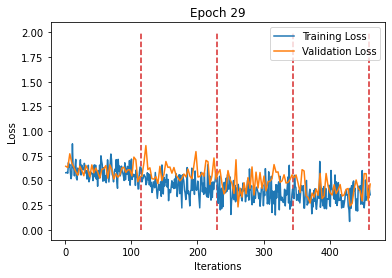

Train



Sequence:1, Seq Training Mean Loss: 0.5735074605630792, Seq Training Acc: 0.7089673913043478
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.45102631838425344, Seq Training Acc: 0.7796195652173913
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3530288622431133, Seq Training Acc: 0.8510869565217392
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.34349669036657915, Seq Training Acc: 0.85
******************************************************************
Epoch:30, Epoch Training Loss Mean: 0.43026480078697205, Epoch Acc: 1.0632246376811594
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6051575494439978, Seq Val Acc: 0.6685855263157895



******************************************************************
Sequence:2, Seq Mean Loss: 0.5609751728020216, Seq Val Acc: 0.7072368421052632



******************************************************************
Sequence:3, Seq Mean Loss: 0.4789307361994034, Seq Val Acc: 0.7748397435897436



******************************************************************
Sequence:4, Seq Mean Loss: 0.3479992268901122, Seq Val Acc: 0.8486842105263158
Epoch:30, Epoch Val Mean Loss: 0.49813932180404663, Epoch Val Acc: 1.006578947368421
******************************************************************


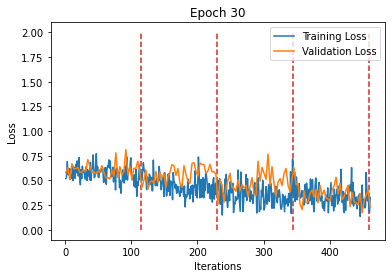

Train



Sequence:1, Seq Training Mean Loss: 0.5730408497478651, Seq Training Acc: 0.7089673913043478
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4384789542011593, Seq Training Acc: 0.7970108695652174
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.35977538448313007, Seq Training Acc: 0.8342391304347826
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3354145661644314, Seq Training Acc: 0.839945652173913
******************************************************************
Epoch:31, Epoch Training Loss Mean: 0.4266774356365204, Epoch Acc: 1.0600543478260869
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.6051405456505323, Seq Val Acc: 0.680921052631579



******************************************************************
Sequence:2, Seq Mean Loss: 0.5298856049776077, Seq Val Acc: 0.75



******************************************************************
Sequence:3, Seq Mean Loss: 0.44712942303755343, Seq Val Acc: 0.7940705128205128



******************************************************************
Sequence:4, Seq Mean Loss: 0.3432185289106871, Seq Val Acc: 0.852796052631579
Epoch:31, Epoch Val Mean Loss: 0.4811199903488159, Epoch Val Acc: 1.0328947368421053
******************************************************************


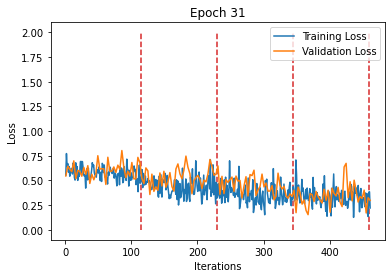

Train



Sequence:1, Seq Training Mean Loss: 0.5576828433119733, Seq Training Acc: 0.7152173913043478
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.44193264919778574, Seq Training Acc: 0.7983695652173913
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.35334105064039645, Seq Training Acc: 0.8323369565217391
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.332118995293327, Seq Training Acc: 0.8548913043478261
******************************************************************
Epoch:32, Epoch Training Loss Mean: 0.42126888036727905, Epoch Acc: 1.0669384057971014
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5911918353093298, Seq Val Acc: 0.6751644736842105



******************************************************************
Sequence:2, Seq Mean Loss: 0.5468671815960031, Seq Val Acc: 0.7195723684210527



******************************************************************
Sequence:3, Seq Mean Loss: 0.42848224288378006, Seq Val Acc: 0.7996794871794872



******************************************************************
Sequence:4, Seq Mean Loss: 0.38147274051841934, Seq Val Acc: 0.8379934210526315
Epoch:32, Epoch Val Mean Loss: 0.4866209924221039, Epoch Val Acc: 1.0178179824561404
******************************************************************


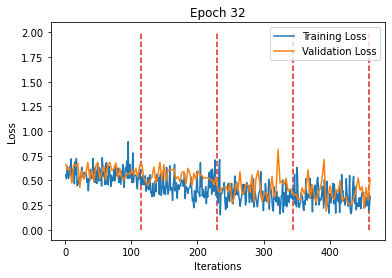

Train



Sequence:1, Seq Training Mean Loss: 0.5584868972716124, Seq Training Acc: 0.7176630434782608
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4274821692186853, Seq Training Acc: 0.7942934782608696
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3672430359798929, Seq Training Acc: 0.8364130434782608
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3058048455611519, Seq Training Acc: 0.8668478260869565
******************************************************************
Epoch:33, Epoch Training Loss Mean: 0.4147542417049408, Epoch Acc: 1.0717391304347825
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5914216841522016, Seq Val Acc: 0.6833881578947368



******************************************************************
Sequence:2, Seq Mean Loss: 0.5671153939084003, Seq Val Acc: 0.7039473684210527



******************************************************************
Sequence:3, Seq Mean Loss: 0.44817247681128675, Seq Val Acc: 0.7932692307692307



******************************************************************
Sequence:4, Seq Mean Loss: 0.335489301697204, Seq Val Acc: 0.8717105263157895
Epoch:33, Epoch Val Mean Loss: 0.48530539870262146, Epoch Val Acc: 1.0243969298245614
******************************************************************


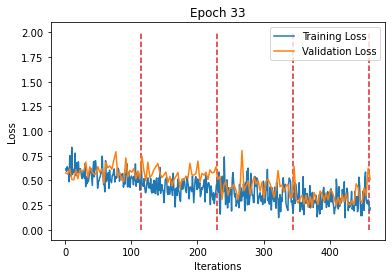

Train



Sequence:1, Seq Training Mean Loss: 0.5490684566290482, Seq Training Acc: 0.7230978260869565
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4273085857215135, Seq Training Acc: 0.7997282608695652
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3625809874223626, Seq Training Acc: 0.8326086956521739
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.32741681259611377, Seq Training Acc: 0.85625
******************************************************************
Epoch:34, Epoch Training Loss Mean: 0.4165937006473541, Epoch Acc: 1.0705615942028985
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5862189805821368, Seq Val Acc: 0.7047697368421053



******************************************************************
Sequence:2, Seq Mean Loss: 0.5691227426654414, Seq Val Acc: 0.7039473684210527



******************************************************************
Sequence:3, Seq Mean Loss: 0.447326225348008, Seq Val Acc: 0.7972756410256411



******************************************************************
Sequence:4, Seq Mean Loss: 0.393717460334301, Seq Val Acc: 0.8240131578947368
Epoch:34, Epoch Val Mean Loss: 0.4987580180168152, Epoch Val Acc: 1.0169956140350878
******************************************************************


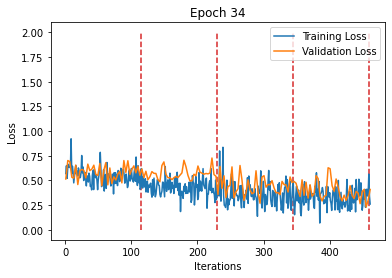

Train



Sequence:1, Seq Training Mean Loss: 0.551331506345583, Seq Training Acc: 0.7277173913043479
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4250336468219757, Seq Training Acc: 0.7994565217391304
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3422959936701733, Seq Training Acc: 0.8467391304347827
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2967463118874508, Seq Training Acc: 0.8665760869565218
******************************************************************
Epoch:35, Epoch Training Loss Mean: 0.40385183691978455, Epoch Acc: 1.080163043478261
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5552045844103161, Seq Val Acc: 0.7162828947368421



******************************************************************
Sequence:2, Seq Mean Loss: 0.5088994950056076, Seq Val Acc: 0.7491776315789473



******************************************************************
Sequence:3, Seq Mean Loss: 0.42488035483238024, Seq Val Acc: 0.7996794871794872



******************************************************************
Sequence:4, Seq Mean Loss: 0.34118100177300603, Seq Val Acc: 0.8445723684210527
Epoch:35, Epoch Val Mean Loss: 0.4573279023170471, Epoch Val Acc: 1.0435855263157894
******************************************************************


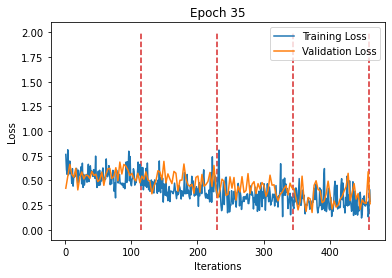

Train



Sequence:1, Seq Training Mean Loss: 0.5467422744502192, Seq Training Acc: 0.7203804347826087
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4099946388731832, Seq Training Acc: 0.8092391304347826
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3433341624944106, Seq Training Acc: 0.8486413043478261
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3145768753860308, Seq Training Acc: 0.8646739130434783
******************************************************************
Epoch:36, Epoch Training Loss Mean: 0.40366196632385254, Epoch Acc: 1.0809782608695653
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5404296909507952, Seq Val Acc: 0.7294407894736842



******************************************************************
Sequence:2, Seq Mean Loss: 0.4985436757928447, Seq Val Acc: 0.756578947368421



******************************************************************
Sequence:3, Seq Mean Loss: 0.39673947676634175, Seq Val Acc: 0.8197115384615384



******************************************************************
Sequence:4, Seq Mean Loss: 0.3386632517764443, Seq Val Acc: 0.8577302631578947
Epoch:36, Epoch Val Mean Loss: 0.44328776001930237, Epoch Val Acc: 1.0616776315789473
******************************************************************


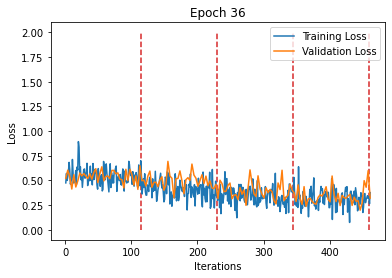

Train



Sequence:1, Seq Training Mean Loss: 0.5319431825824406, Seq Training Acc: 0.7361413043478261
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4174135683671288, Seq Training Acc: 0.8081521739130435
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3444990362162175, Seq Training Acc: 0.8410326086956522
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3079446122698162, Seq Training Acc: 0.8644021739130435
******************************************************************
Epoch:37, Epoch Training Loss Mean: 0.40045011043548584, Epoch Acc: 1.0832427536231883
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.524790210943473, Seq Val Acc: 0.759046052631579



******************************************************************
Sequence:2, Seq Mean Loss: 0.4874695821812278, Seq Val Acc: 0.7631578947368421



******************************************************************
Sequence:3, Seq Mean Loss: 0.3923417857060066, Seq Val Acc: 0.8285256410256411



******************************************************************
Sequence:4, Seq Mean Loss: 0.3598169817736274, Seq Val Acc: 0.8355263157894737
Epoch:37, Epoch Val Mean Loss: 0.4407859146595001, Epoch Val Acc: 1.0693530701754386
******************************************************************


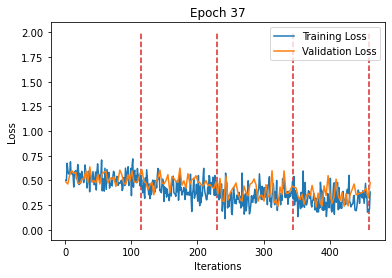

Train



Sequence:1, Seq Training Mean Loss: 0.5172779373500658, Seq Training Acc: 0.7521739130434782
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4199485658303551, Seq Training Acc: 0.7980978260869566
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.34427440257176106, Seq Training Acc: 0.8445652173913043
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.29496491130279456, Seq Training Acc: 0.871195652173913
******************************************************************
Epoch:38, Epoch Training Loss Mean: 0.39411643147468567, Epoch Acc: 1.0886775362318841
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5326809726263347, Seq Val Acc: 0.7442434210526315



******************************************************************
Sequence:2, Seq Mean Loss: 0.5286067449732831, Seq Val Acc: 0.7351973684210527



******************************************************************
Sequence:3, Seq Mean Loss: 0.4187433773126358, Seq Val Acc: 0.8020833333333334



******************************************************************
Sequence:4, Seq Mean Loss: 0.3138240838521405, Seq Val Acc: 0.8774671052631579
Epoch:38, Epoch Val Mean Loss: 0.4482695758342743, Epoch Val Acc: 1.060032894736842
******************************************************************


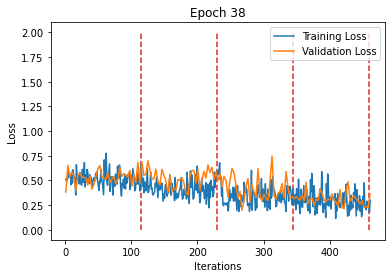

Train



Sequence:1, Seq Training Mean Loss: 0.5133965430052384, Seq Training Acc: 0.7497282608695652
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4027415666891181, Seq Training Acc: 0.8133152173913043
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3311562710482141, Seq Training Acc: 0.8467391304347827
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.30051421769287273, Seq Training Acc: 0.8646739130434783
******************************************************************
Epoch:39, Epoch Training Loss Mean: 0.38695213198661804, Epoch Acc: 1.0914855072463767
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5164282125862021, Seq Val Acc: 0.7623355263157895



******************************************************************
Sequence:2, Seq Mean Loss: 0.5109331913684544, Seq Val Acc: 0.7631578947368421



******************************************************************
Sequence:3, Seq Mean Loss: 0.4115269207037412, Seq Val Acc: 0.8221153846153846



******************************************************************
Sequence:4, Seq Mean Loss: 0.34805359103177724, Seq Val Acc: 0.8478618421052632
Epoch:39, Epoch Val Mean Loss: 0.4465053677558899, Epoch Val Acc: 1.0723684210526316
******************************************************************


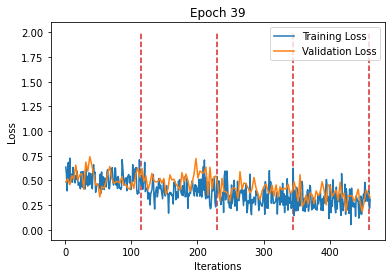

Train



Sequence:1, Seq Training Mean Loss: 0.5212128082047338, Seq Training Acc: 0.7350543478260869
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.39950768014659055, Seq Training Acc: 0.8105978260869565
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3326633759166883, Seq Training Acc: 0.846195652173913
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.28821317922809847, Seq Training Acc: 0.873641304347826
******************************************************************
Epoch:40, Epoch Training Loss Mean: 0.3853992521762848, Epoch Acc: 1.0884963768115943
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5119702118007761, Seq Val Acc: 0.7442434210526315



******************************************************************
Sequence:2, Seq Mean Loss: 0.5097125196143201, Seq Val Acc: 0.7598684210526315



******************************************************************
Sequence:3, Seq Mean Loss: 0.3884076674779256, Seq Val Acc: 0.8357371794871795



******************************************************************
Sequence:4, Seq Mean Loss: 0.34435997589638356, Seq Val Acc: 0.852796052631579
Epoch:40, Epoch Val Mean Loss: 0.4382844865322113, Epoch Val Acc: 1.071546052631579
******************************************************************


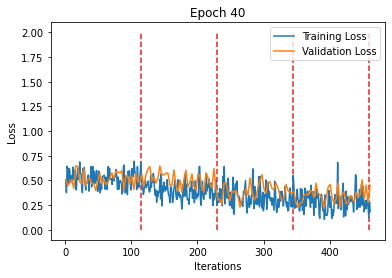

Train



Sequence:1, Seq Training Mean Loss: 0.49031345429627793, Seq Training Acc: 0.7684782608695652
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.41174453600593236, Seq Training Acc: 0.8027173913043478
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.33604960363844166, Seq Training Acc: 0.85
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3032634590630946, Seq Training Acc: 0.8747282608695652
******************************************************************
Epoch:41, Epoch Training Loss Mean: 0.3853427469730377, Epoch Acc: 1.098641304347826
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.4984303210910998, Seq Val Acc: 0.7606907894736842



******************************************************************
Sequence:2, Seq Mean Loss: 0.4630859454995708, Seq Val Acc: 0.7894736842105263



******************************************************************
Sequence:3, Seq Mean Loss: 0.39786883118825084, Seq Val Acc: 0.8213141025641025



******************************************************************
Sequence:4, Seq Mean Loss: 0.3399864101880475, Seq Val Acc: 0.8651315789473685
Epoch:41, Epoch Val Mean Loss: 0.42466655373573303, Epoch Val Acc: 1.0860745614035088
******************************************************************


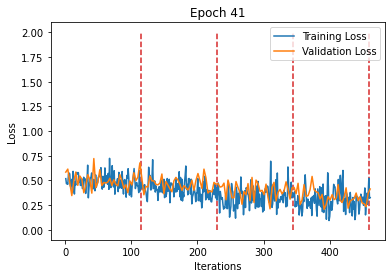

Train



Sequence:1, Seq Training Mean Loss: 0.5140763982482578, Seq Training Acc: 0.7456521739130435
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3904958118563113, Seq Training Acc: 0.81875
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.32016917149657786, Seq Training Acc: 0.8616847826086956
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.28748766371737355, Seq Training Acc: 0.8633152173913043
******************************************************************
Epoch:42, Epoch Training Loss Mean: 0.37805724143981934, Epoch Acc: 1.096467391304348
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5263978454627489, Seq Val Acc: 0.7384868421052632



******************************************************************
Sequence:2, Seq Mean Loss: 0.4500367155200557, Seq Val Acc: 0.7927631578947368



******************************************************************
Sequence:3, Seq Mean Loss: 0.3754773674867092, Seq Val Acc: 0.844551282051282



******************************************************************
Sequence:4, Seq Mean Loss: 0.3375192861023702, Seq Val Acc: 0.8560855263157895
Epoch:42, Epoch Val Mean Loss: 0.42205142974853516, Epoch Val Acc: 1.084703947368421
******************************************************************


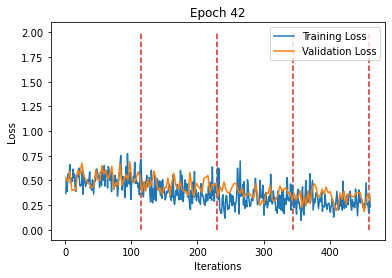

Train



Sequence:1, Seq Training Mean Loss: 0.4937660041062728, Seq Training Acc: 0.7576086956521739
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3970756822306177, Seq Training Acc: 0.8252717391304348
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3241208983504254, Seq Training Acc: 0.8546195652173914
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2872543639462927, Seq Training Acc: 0.8782608695652174
******************************************************************
Epoch:43, Epoch Training Loss Mean: 0.37555423378944397, Epoch Acc: 1.1052536231884058
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.4896664737086547, Seq Val Acc: 0.7697368421052632



******************************************************************
Sequence:2, Seq Mean Loss: 0.44901413274438756, Seq Val Acc: 0.8108552631578947



******************************************************************
Sequence:3, Seq Mean Loss: 0.3818330248961082, Seq Val Acc: 0.8461538461538461



******************************************************************
Sequence:4, Seq Mean Loss: 0.3738414433441664, Seq Val Acc: 0.8388157894736842
Epoch:43, Epoch Val Mean Loss: 0.4233158230781555, Epoch Val Acc: 1.0959429824561404
******************************************************************


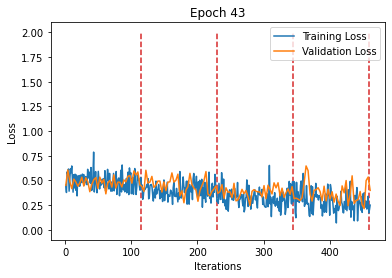

Train



Sequence:1, Seq Training Mean Loss: 0.4906870510267175, Seq Training Acc: 0.7584239130434782
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3945009256186693, Seq Training Acc: 0.8168478260869565
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3358864732410597, Seq Training Acc: 0.8472826086956522
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.29832305137230003, Seq Training Acc: 0.8701086956521739
******************************************************************
Epoch:44, Epoch Training Loss Mean: 0.379849374294281, Epoch Acc: 1.097554347826087
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5082334938802218, Seq Val Acc: 0.7532894736842105



******************************************************************
Sequence:2, Seq Mean Loss: 0.4493071554522765, Seq Val Acc: 0.790296052631579



******************************************************************
Sequence:3, Seq Mean Loss: 0.38658139491692567, Seq Val Acc: 0.8333333333333334



******************************************************************
Sequence:4, Seq Mean Loss: 0.37856207670349823, Seq Val Acc: 0.8379934210526315
Epoch:44, Epoch Val Mean Loss: 0.4303828775882721, Epoch Val Acc: 1.0789473684210527
******************************************************************


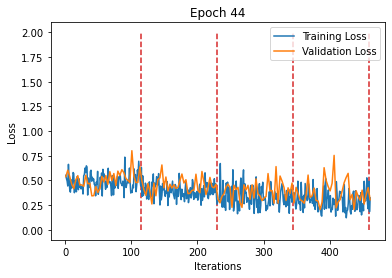

Train



Sequence:1, Seq Training Mean Loss: 0.5018600932929826, Seq Training Acc: 0.7494565217391305
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4093525479669156, Seq Training Acc: 0.8002717391304348
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3144759932289953, Seq Training Acc: 0.8589673913043478
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.27641585252207257, Seq Training Acc: 0.8771739130434782
******************************************************************
Epoch:45, Epoch Training Loss Mean: 0.3755261301994324, Epoch Acc: 1.0952898550724637
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.48041694885806036, Seq Val Acc: 0.7828947368421053



******************************************************************
Sequence:2, Seq Mean Loss: 0.44655807943720566, Seq Val Acc: 0.7870065789473685



******************************************************************
Sequence:3, Seq Mean Loss: 0.37476338560764605, Seq Val Acc: 0.844551282051282



******************************************************************
Sequence:4, Seq Mean Loss: 0.33314931039747436, Seq Val Acc: 0.8585526315789473
Epoch:45, Epoch Val Mean Loss: 0.4085000157356262, Epoch Val Acc: 1.0984100877192982
******************************************************************


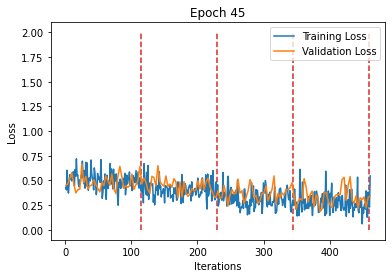

Train



Sequence:1, Seq Training Mean Loss: 0.4886377337186233, Seq Training Acc: 0.7638586956521739
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.40942013639470803, Seq Training Acc: 0.8002717391304348
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.32180183776046917, Seq Training Acc: 0.8546195652173914
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2800341494705366, Seq Training Acc: 0.88125
******************************************************************
Epoch:46, Epoch Training Loss Mean: 0.37497347593307495, Epoch Acc: 1.1
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.5122326204651281, Seq Val Acc: 0.759046052631579



******************************************************************
Sequence:2, Seq Mean Loss: 0.4248994463368466, Seq Val Acc: 0.8050986842105263



******************************************************************
Sequence:3, Seq Mean Loss: 0.3806241716329868, Seq Val Acc: 0.8261217948717948



******************************************************************
Sequence:4, Seq Mean Loss: 0.3587181685786498, Seq Val Acc: 0.837171052631579
Epoch:46, Epoch Val Mean Loss: 0.41886696219444275, Epoch Val Acc: 1.0830592105263157
******************************************************************


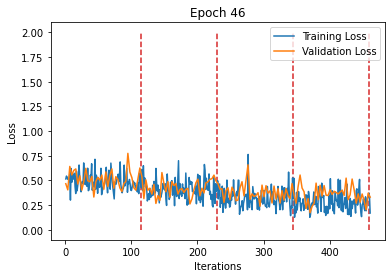

Train



Sequence:1, Seq Training Mean Loss: 0.4900383065576139, Seq Training Acc: 0.7657608695652174
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3988099410482075, Seq Training Acc: 0.8125
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.31634741917900416, Seq Training Acc: 0.8592391304347826
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.27629680069892304, Seq Training Acc: 0.8785326086956522
******************************************************************
Epoch:47, Epoch Training Loss Mean: 0.3703731298446655, Epoch Acc: 1.1053442028985507
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.4983012025293551, Seq Val Acc: 0.7639802631578947



******************************************************************
Sequence:2, Seq Mean Loss: 0.423939195902724, Seq Val Acc: 0.8050986842105263



******************************************************************
Sequence:3, Seq Mean Loss: 0.3865619989541861, Seq Val Acc: 0.8277243589743589



******************************************************************
Sequence:4, Seq Mean Loss: 0.36284970452910975, Seq Val Acc: 0.8289473684210527
Epoch:47, Epoch Val Mean Loss: 0.4177081286907196, Epoch Val Acc: 1.0825109649122806
******************************************************************


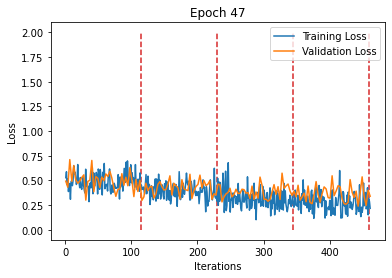

Train



Sequence:1, Seq Training Mean Loss: 0.5014026481172312, Seq Training Acc: 0.7597826086956522
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3956912128821663, Seq Training Acc: 0.8152173913043478
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3164462848202042, Seq Training Acc: 0.8573369565217391
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2901836047353952, Seq Training Acc: 0.8698369565217391
******************************************************************
Epoch:48, Epoch Training Loss Mean: 0.37593090534210205, Epoch Acc: 1.1007246376811595
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.4925858825445175, Seq Val Acc: 0.7697368421052632



******************************************************************
Sequence:2, Seq Mean Loss: 0.41168089838404404, Seq Val Acc: 0.8174342105263158



******************************************************************
Sequence:3, Seq Mean Loss: 0.40744910943202484, Seq Val Acc: 0.813301282051282



******************************************************************
Sequence:4, Seq Mean Loss: 0.3621710750617479, Seq Val Acc: 0.8363486842105263
Epoch:48, Epoch Val Mean Loss: 0.4183996915817261, Epoch Val Acc: 1.0860745614035088
******************************************************************


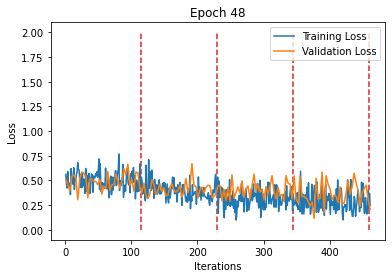

Train



Sequence:1, Seq Training Mean Loss: 0.4789524298647176, Seq Training Acc: 0.7665760869565217
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3897543907165527, Seq Training Acc: 0.8269021739130434
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3310851649745651, Seq Training Acc: 0.8478260869565217
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2824181213974953, Seq Training Acc: 0.8682065217391305
******************************************************************
Epoch:49, Epoch Training Loss Mean: 0.37055253982543945, Epoch Acc: 1.1031702898550724
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.4964851423313743, Seq Val Acc: 0.7623355263157895



******************************************************************
Sequence:2, Seq Mean Loss: 0.4134125882073453, Seq Val Acc: 0.8322368421052632



******************************************************************
Sequence:3, Seq Mean Loss: 0.3533836297499828, Seq Val Acc: 0.8549679487179487



******************************************************************
Sequence:4, Seq Mean Loss: 0.329100402170106, Seq Val Acc: 0.852796052631579
Epoch:49, Epoch Val Mean Loss: 0.3978032171726227, Epoch Val Acc: 1.1082785087719298
******************************************************************


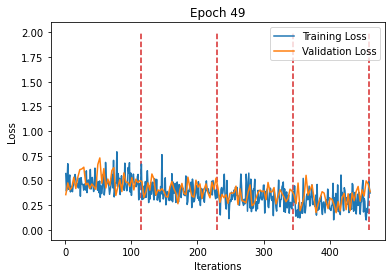

Train



Sequence:1, Seq Training Mean Loss: 0.4806401050609091, Seq Training Acc: 0.7679347826086956
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4019898047913676, Seq Training Acc: 0.8125
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3131194770336151, Seq Training Acc: 0.8614130434782609
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.26689120420943135, Seq Training Acc: 0.8831521739130435
******************************************************************
Epoch:50, Epoch Training Loss Mean: 0.365660160779953, Epoch Acc: 1.1083333333333334
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Mean Loss: 0.504555438694201, Seq Val Acc: 0.7664473684210527



******************************************************************
Sequence:2, Seq Mean Loss: 0.41225359392793554, Seq Val Acc: 0.8116776315789473



******************************************************************
Sequence:3, Seq Mean Loss: 0.3861852196546701, Seq Val Acc: 0.8245192307692307



******************************************************************
Sequence:4, Seq Mean Loss: 0.3255432702993092, Seq Val Acc: 0.8544407894736842
Epoch:50, Epoch Val Mean Loss: 0.4069974720478058, Epoch Val Acc: 1.0929276315789473
******************************************************************


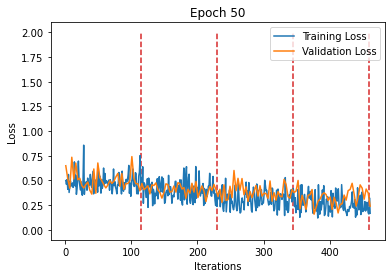


Save Model


TypeError: forward() takes 3 positional arguments but 4 were given

In [29]:
if run_train:
    #writer = SummaryWriter('runs/Regenerated_Type2_Dataset_Experiment_lr' + str(lr) + '_' + timestampStr)
    writer = SummaryWriter('runs/008_Experiment_3stripe_lr' + str(lr) + '_' + timestampStr)
    max_iter_per_seq = 115
    # 训练迭代总步数
    num_train_iter_per_epoch = 0
    num_train_iterations = [] # For plot parting line
    for seq_dataloaders in dataloaders:
        if len(seq_dataloaders[train_dl_idx]) <= max_iter_per_seq:
            num_train_iter_per_epoch += len(seq_dataloaders[train_dl_idx])
        else:
            num_train_iter_per_epoch += max_iter_per_seq
        num_train_iterations.append(num_train_iter_per_epoch)
    print("Total Train Iterations: ",num_train_iter_per_epoch)
    print("Total Train Iterations List: ",num_train_iterations)
        
    # 训练迭代总步数为验证迭代总步数的3倍
    num_val_iterations = [int(number / 3) for number in num_train_iterations]
    num_val_iter_per_epoch = num_val_iterations[-1]
    
    # iterations in every seq
    num_val_iter_per_seq = []
    num_val_iter_per_seq.append(num_val_iterations[0])
    for i in range(len(num_val_iterations)-1):
        diff = num_val_iterations[i+1] - num_val_iterations[i] # The latter minus the former
        num_val_iter_per_seq.append(diff)
        
    print(num_val_iter_per_seq)
        
    optimizer = torch.optim.Adam(model.parameters(),lr=lr,eps=1e-08)

    scheduler = OneCycleLR(optimizer, num_train_iter_per_epoch, num_epochs, min_lr_factor=min_lr_factor)
    scheduler.step(epoch=0)
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.
    loss_min = 0.
    
    for epoch in tqdm(range(1,num_epochs+1)):

        print('Train')

        model.train()
        
        running_corrects = 0

        train_loss_array = np.zeros(num_train_iter_per_epoch, dtype=np.single)

        # mse_y = torch.zeros(batch_sizes[0]//2).to(device)
        
        i = 0
        seq_idx = 1
        for (refs, train_dl) in zip(refs_list,train_dls):
            # obtain the refs in every seq
            
            curr_train_dl = train_dl

            curr_refs = refs.float().to(device)

            # Training
            dl_iter = iter(curr_train_dl)
            
            # This two only used to compute the loss and acc in every Sequence
            running_loss = 0
            corrects = 0
            for idx in tqdm(range(len(curr_train_dl))):
                if idx >= max_iter_per_seq:
                    break
                try:
                    img1, img2, targets = next(dl_iter)

                except (StopIteration, TypeError):
                    dl_iter = iter(curr_train_dl)
                    img1, img2, targets = next(dl_iter)
                
                scheduler.zero_grad()

                img1 = img1.float().to(device)
                img2 = img2.float().to(device)
                targets = targets.view(-1)
                targets = targets.float().to(device)

                # forward pass
                loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                
                loss.backward()
                
                running_loss += loss.item()
                corrects += torch.sum(preds == targets)
                running_corrects += torch.sum(preds == targets)

                train_loss_array[i] = loss.cpu().detach().numpy()
               
                
                # record loss and accuracy per iteration
                c = torch.sum(preds == targets)
                acc = int(c) / img1.size(0)
                writer.add_scalar('Train/Loss per Iteration',train_loss_array[i], ((epoch - 1) * num_train_iter_per_epoch)+ i)
                writer.add_scalar('Train/Acc per Iteration',acc, ((epoch - 1) * num_train_iter_per_epoch)+ i)
                
                # Record the lr
                curr_lr = get_lr(optimizer)
                writer.add_scalar('Train/Learning Rate',curr_lr , ((epoch - 1) * num_train_iter_per_epoch)+ i)
                
                i += 1
                scheduler.step()
            
            # record loss and accuracy in every train dataloader (namely every Sequence)
            #seq_train_mean_loss = running_loss / len(curr_train_dl)
            #seq_train_acc = int(corrects) / (len(curr_train_dl) * img1.size(0))
            seq_train_mean_loss = running_loss / max_iter_per_seq
            seq_train_acc = int(corrects) / (max_iter_per_seq * img1.size(0))
            
            print("Sequence:{}, Seq Training Mean Loss: {}, Seq Training Acc: {}".format(seq_idx, seq_train_mean_loss, seq_train_acc))
            print("******************************************************************")
            # Record the loss and acc in every Seq in Tensorboard
            writer.add_scalar('Train/Seq Training Mean Loss',seq_train_mean_loss, (epoch - 1) * len(train_dls) + seq_idx)
            writer.add_scalar('Train/Seq Training Accuracy', seq_train_acc, (epoch - 1) * len(train_dls) + seq_idx)
            writer.add_scalar('Train/Seq Error Rate',1 - seq_train_acc, (epoch - 1) * len(train_dls) + seq_idx)
            
            seq_idx += 1
            
        # after one epoch update scheduler   
        # Plot lr policy
        curr_lr = get_lr(optimizer)
        writer.add_scalar('Train/Learning Rate Policy',curr_lr , epoch)
        writer.flush()
            
        # record loss and accuracy in every epoch (namely 6 Sequences)
        epoch_train_mean_loss = train_loss_array.mean()  # std
        epoch_train_acc = int(running_corrects) / (max_iter_per_seq* 3 * img1.size(0))

        print("Epoch:{}, Epoch Training Loss Mean: {}, Epoch Acc: {}".format(epoch, epoch_train_mean_loss, epoch_train_acc))
        print("******************************************************************")
        
        ### Validation
        print('Validation')
        model.eval()
        val_loss_array = np.zeros(num_val_iter_per_epoch, dtype=np.single)
        
        running_corrects = 0

        i = 0
        with torch.no_grad():
            seq_idx = 1
            for (refs, valid_dl, max_num) in zip(refs_list,valid_dls, num_val_iter_per_seq):
                
                curr_valid_dl = valid_dl
                curr_refs = refs.float().to(device)
                iter_max_num = max_num
            
                dl_iter = iter(curr_valid_dl)
                # This two uesd to compute loss and accurary in every Seq
                running_loss = 0
                corrects = 0
                for dl_idx in tqdm(range(iter_max_num)):
                    try:
                        img1, img2, targets = next(dl_iter)
                    except (StopIteration, TypeError):
                        dl_iter = iter(curr_valid_dl)
                        img1, img2, targets = next(dl_iter)
                    
                    scheduler.zero_grad()

                    img1 = img1.float().to(device)
                    img2 = img2.float().to(device)
                    targets = targets.view(-1)
                    targets = targets.float().to(device)
                
                    loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                    
                    running_loss += loss.item()
                    corrects += torch.sum(preds == targets)
                    running_corrects += torch.sum(preds == targets)
                    
                    # record loss and accuracy in every iteration
                    c = torch.sum(preds == targets)
                    acc = int(c) / img1.size(0)
                    writer.add_scalar('Validation/Loss per Iteration',loss.item(), ((epoch - 1) * num_val_iter_per_epoch)+ i)
                    writer.add_scalar('Validation/Acc per Iteration',acc, ((epoch - 1) * num_val_iter_per_epoch)+ i)

                    val_loss_array[i] = loss.cpu().detach().numpy()
                    i += 1
            
                #seq_val_mean_loss = running_loss / len(curr_valid_dl)
                #seq_val_acc = int(corrects) / (len(curr_valid_dl) * img1.size(0))
                seq_val_mean_loss = running_loss / iter_max_num
                seq_val_acc = int(corrects) / (iter_max_num * img1.size(0))
                print("******************************************************************")
                print("Sequence:{}, Seq Mean Loss: {}, Seq Val Acc: {}".format(seq_idx,seq_val_mean_loss, seq_val_acc))
                
                writer.add_scalar('Validation/Seq Mean Loss',seq_val_mean_loss, (epoch - 1) * len(valid_dls) + seq_idx)
                writer.add_scalar('Validation/Seq Accuracy', seq_val_acc, (epoch - 1) * len(valid_dls) + seq_idx)
                writer.add_scalar('Validation/Seq Error Rate',1 - seq_val_acc, (epoch - 1) * len(valid_dls) + seq_idx)
                
                seq_idx += 1
                
            epoch_val_mean_loss = val_loss_array.mean()  # std
            epoch_val_acc = int(running_corrects) / (iter_max_num*3 * img1.size(0))

            print("Epoch:{}, Epoch Val Mean Loss: {}, Epoch Val Acc: {}".format(epoch, epoch_val_mean_loss, epoch_val_acc))
            print("******************************************************************")
            
        # save best model weights
        if epoch_val_acc > best_acc:
            best_model_wts = copy.deepcopy(model.state_dict())
            loss_min = epoch_val_mean_loss
            
        # Tensorboard
        writer.add_scalars('Epoch/Loss', {"Training Loss": epoch_train_mean_loss,
                                          "Validation Loss": epoch_val_mean_loss}, epoch)
        writer.add_scalars('Epoch/Accuracy', {"Training Accuracy":epoch_train_acc,
                                              "Validation Accuracy": epoch_val_acc}, epoch)
        writer.add_scalars('Epoch/Error Rate', {"Training": 1 - epoch_train_acc,
                                                "Validation": 1 - epoch_val_acc}, epoch)
        writer.flush()
        
        plt.plot(np.linspace(1, train_loss_array.size+1, train_loss_array.size), train_loss_array,label='Training Loss')
        plt.plot(np.linspace(1, train_loss_array.size+1, val_loss_array.size), val_loss_array, label='Validation Loss')
        
        train_parting_line = num_train_iterations  # 1128 iterations in total in training
        val_parting_line = num_val_iterations  # 373 iterations in total in validation
        plt.vlines(train_parting_line, 0, 2, colors = "tab:red", linestyles = "dashed")
        #plt.vlines(val_parting_line, 0, 2, colors = "tab:orange", linestyles = "dashed")
        
        plt.title('Epoch {}'.format(epoch))
        plt.xlabel('Iterations')
        plt.ylabel('Loss')
        plt.legend(loc='upper right')
        plt.show()
        
    print("Save Model")
    torch.save(model, net_path + '/m-' + timestampStr)
    torch.save({'epoch': epoch, 
                'state_dict': best_model_wts, 
                'best_loss': loss_min,
                'optimizer': optimizer.state_dict()},
                net_path + '/m-' + timestampStr + '-' + str("%.4f" % loss_min) + '.pth.tar')
    # add model to tensorboard
    writer.add_graph(model,(img1, curr_refs, targets))
    writer.flush()

    print('Finished Training')
        

### Valid Config

In [31]:
batch_size = 32
valid_dl_idx = 1
num_test_iter_per_epoch = 0
for seq_dataloaders in dataloaders:
    num_test_iter_per_epoch += len(seq_dataloaders[valid_dl_idx])
    
model.eval()
y_vect = np.zeros(batch_size * num_test_iter_per_epoch)
y_tilde_vect = np.zeros(batch_size * num_test_iter_per_epoch)

i = 0
with torch.no_grad():
    seq_idx = 1
    
    running_corrects = 0

    test_loss_array = np.zeros(num_test_iter_per_epoch, dtype=np.single)
    
    for (refs, test_dl) in zip(refs_list,valid_dls):
        
        curr_test_dl = test_dl
        
        curr_refs = refs.float().to(device) 

        dl_iter = iter(curr_test_dl)
        
        # This two uesd to compute loss and accurary in every Seq
        running_loss = 0
        corrects = 0

        for dl_idx in tqdm(range(len(curr_test_dl))):
            try:
                img1, img2, targets = next(dl_iter)
            except (StopIteration, TypeError):
                dl_iter = iter(curr_valid_dl)
                img1, img2, targets = next(dl_iter)

            scheduler.zero_grad()
            img1 = img1.float().to(device)
            img2 = img2.float().to(device)
            targets = targets.view(-1)
            targets = targets.float().to(device)
              
            loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                    
            running_loss += loss.item()
            corrects += torch.sum(preds == targets)
            
            test_loss_array[i] = loss.cpu().detach().numpy()

            y_vect[i*batch_size:(i+1)*batch_size] = targets.detach().cpu().numpy()
            y_tilde_vect[i*batch_size:(i+1)*batch_size] = preds.detach().cpu().numpy()
            
            # record loss and accuracy per iteration
            c = torch.sum(preds == targets)
            acc = int(c) / img1.size(0)
            
            writer.add_scalar('Test/Loss per Iteration',test_loss_array[i], i)
            writer.add_scalar('Test/Acc per Iteration',acc, i)
            writer.add_scalar('Test/Error Rate', 1 - acc, i)

            i += 1
        # record seq test loss and acc
        seq_test_mean_loss = running_loss / len(curr_test_dl)
        seq_test_acc = int(corrects) / (len(curr_test_dl) * img1.size(0))
        
        print("******************************************************************")
        print("Test: Sequence:{}, Seq Mean Loss: {}, Seq Acc: {}".format(seq_idx,seq_test_mean_loss, seq_test_acc))
            
        writer.add_scalar('Test/Seq Loss', seq_test_mean_loss, seq_idx)
        writer.add_scalar('Test/Seq Accuracy', seq_test_acc, seq_idx)
        writer.add_scalar('Test/Seq Error Rate', 1 - seq_test_acc, seq_idx)
        
        seq_idx += 1

writer.close()
                                      
print("Test finished")


******************************************************************
Test: Sequence:1, Seq Mean Loss: 0.5054218509258368, Seq Acc: 0.7467948717948718



******************************************************************
Test: Sequence:2, Seq Mean Loss: 0.4040585160255432, Seq Acc: 0.8254310344827587



******************************************************************
Test: Sequence:3, Seq Mean Loss: 0.3600095983209281, Seq Acc: 0.8469827586206896



******************************************************************
Test: Sequence:4, Seq Mean Loss: 0.37352838051138504, Seq Acc: 0.8522727272727273
Test finished


### Init test dataset for plotting degradation metrics 

In [32]:
def init_test_dataset(path,seq_idx_list,mean_val,std_val):

    ds_h5 = []
    refs_list = []

    img_transforms = [RandomRotateGrayscale(rot_range=[-0.1, 0.1], fill=150),
                      RandomFlip(lr_prob=0.5, ud_prob=0.5),
                      transforms.ToTensor(),
                      transforms.Normalize((mean_val,),(std_val,))]
    
    composed_img_transforms = transforms.Compose(img_transforms)
    
    # to obtain the Seq data
    for seq_idx in seq_idx_list:
        h5_fpath = path.format(seq_idx)
        h5_f = DatasetH5ForTest(h5_fpath,normalize_im=False, transform = composed_img_transforms)
        
        # obtain the references, the first 10 images in every Seq.
        refs = h5_f.getRef()
        refs_list.append(refs)
        
        ds_h5.append(h5_f)

    return refs_list, ds_h5

In [34]:
data_path_type1 = "../MA/NewData/22008_1000202026_652510007"
fnames_type1 = "regenerated_roi_ms1_seq{}_720x30.h5" # 4,6,7,8
combined_path_type1 = os.path.join(data_path_type1, fnames_type1)
seq_idx_list_type1 = [4,6,7,8]

inputs_shape = [1,720,30]
mean_val = 0
std_val = 255

refs_list, ds_h5_test = init_test_dataset(combined_path_type1,seq_idx_list_type1,mean_val,std_val)

In [35]:
ds_h5_test

Init Dataloader for degradation value

In [36]:
batch_size = 1
test_dataloaders = []
for ds in ds_h5_test: 
    test_dataloader = DataLoader(dataset = ds, batch_size=batch_size, shuffle = False)
    test_dataloaders.append(test_dataloader)

### Degradation metrics function

In [37]:
def degradation_metrics(v1, refs_tensor):
    r"""Calculate distance between vector of img1&img2 and each reference images
    Args:
        v1 (Tensor, torch.Size[batchsize,128]): batch of imgs from feature extractor
        
        refs_vectors(List of Tensor, torch.Size([1,128])): List of 10 refs vectors
    """
    v_dim = v1.size(1) # 128
    num_ref = refs_tensor.size(0)

    v11 = v1.unsqueeze(1).repeat(1, num_ref, 1)
    refs = refs_tensor.unsqueeze(0).repeat(v1.size(0), 1, 1)  #v1.size(0) = batch size
    
    kernel_matrix1 = (v11-refs).pow(2).sum(2) 
    
    metric = torch.mean(kernel_matrix1,dim = 1) 

    return metric

In [ ]:
for dataset in datasets[4, 6, 7, 8]:
    
    seq_deg = np.zeros(len(dataset))
    for batch in dataset:
        # Compute Degradation Metric
        seq_deg[i] = deg_metric
        
    # Compute outlier based on result
    rel_outlier_idx = np.abs(seq_deg - mov_aver) > 3
    # Save indices
    np.save()

In [39]:
all_seq_y_tilde_vect = np.zeros(0)
time_ids = []

for refs,dl in zip(refs_list, test_dataloaders):

    curr_refs = refs.float().to(device)
    num_data = len(dl)
    print(num_data)
    
    loss_vect = np.zeros(num_data)
    var_res_vect= np.zeros(num_data)

    y_vect = np.zeros(num_data)
    y_tilde_vect = np.zeros(num_data)
    
    dl_iter = iter(dl)

    for i in tqdm(range(num_data)):
        try:
            img,label = next(dl_iter)

        except (StopIteration, TypeError):
            dl_iter = iter(curr_train_dl)
            img,label = next(dl_iter)
            
        y_vect[i] = label
        
        img = img.float().to(device)
                
        #targets = targets.float().to(device)
        
        #v1, refs_v = model.forward_test(img, curr_refs)
        #metric = degradation_metrics(v1,refs_v)
        
        metric = model.forward(img, curr_refs)
        
        y_tilde = metric.detach().cpu().numpy()

        var_res_vect[i] = np.var(y_tilde)

        y_tilde_vect[i] = y_tilde.mean()

        loss_vect[i] = np.abs(label - y_tilde_vect[i])
        
    time_ids.append(y_tilde_vect.size)
        
    all_seq_y_tilde_vect = np.concatenate((all_seq_y_tilde_vect, y_tilde_vect))

6412



4781



4797



5331


<IPython.core.display.Javascript object>


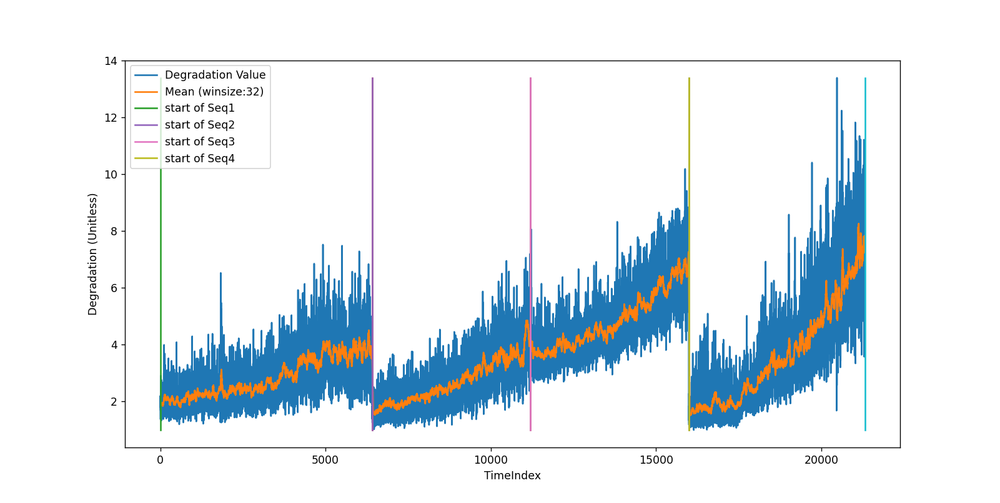

In [41]:
%matplotlib notebook
plt.plot(all_seq_y_tilde_vect, label='Degradation Value')
plt.plot(pd.Series(all_seq_y_tilde_vect).rolling(32).mean(), label='Mean (winsize:32)')

min_y = all_seq_y_tilde_vect.min()
max_y = all_seq_y_tilde_vect.max()

#curr_x_pos = 0
#for i in range(1, len(im_ds_h5)):
#    print(len(im_ds_h5[i]))
#    curr_x_pos += len(im_ds_h5[i])
#    plt.plot([curr_x_pos, curr_x_pos], [min_y, max_y])

# Type 1 Data
seq_period_iloc = [
    [    0,  6412],
    [ 6412, 11193],
    [ 11193, 15990],
    [ 15990, 21321],
]
'''
# Type 2 , 1 stripe Data
seq_period_iloc = [
    [    0,  15279],
    [ 15279, 24159],
    [ 24159, 28928],
    [ 28928, 46149],
]
'''

seq_index = 1
for stime_iloc, etime_iloc in seq_period_iloc:
    plt.plot([stime_iloc, stime_iloc], [min_y, max_y], label = "start of Seq{}".format(seq_index))
    plt.plot([etime_iloc, etime_iloc], [min_y, max_y])
    seq_index += 1


plt.ylabel("Degradation (Unitless)")
plt.xlabel("TimeIndex")

plt.legend()
plt.show()

In [79]:
import plotly.graph_objects as go

fig = go.Figure()

plot_raw_pts = True
    
fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=all_seq_y_tilde_vect,
        mode='lines',
        name = 'Degradation Metric',
        #mode='lines+markers',
    )
)

fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean(),
        mode='lines',
        name = 'Mean(Windowsize:32)',
        #mode='lines+markers',
    )
)

In [80]:
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# Create traces
trace0 = go.Scatter(
            x=np.arange(all_seq_y_tilde_vect.size),
            y=all_seq_y_tilde_vect,
            mode='lines',
            name = 'Degradation Metric',
            #mode='lines+markers',
            )

trace1 = go.Scatter(
            x=np.arange(all_seq_y_tilde_vect.size),
            y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean(),
            mode='lines',
            name = 'Mean(Windowsize:32)',
            #mode='lines+markers',
            )

# Fill out data with our traces
data = [trace0, trace1]
# Plot it and save as basic-line.html
pyo.iplot(data, filename = 'basic-line')

# Finde Outliers

In [64]:
all_seq_y_tilde_vect.size

21321

In [69]:
y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean()
mov_avg = pd.Series(all_seq_y_tilde_vect).rolling(32,min_periods=1).mean()

In [72]:
res = all_seq_y_tilde_vect - mov_avg

In [73]:
res[0]

0.0

In [89]:

trace0 = go.Scatter(
            x=np.arange(all_seq_y_tilde_vect.size),
            y=res,
            mode='lines',
            name='Subtract the mean',
            #mode='lines+markers',
    )



trace1 = go.Scatter(
            x= np.arange(all_seq_y_tilde_vect.size),
            y= np.linspace(2.5,2.5,all_seq_y_tilde_vect.size),
            mode='lines',
            name = 'Threshold',
            #mode='lines+markers',
            )

trace2 = go.Scatter(
            x= np.arange(all_seq_y_tilde_vect.size),
            y= np.linspace(-2.5,-2.5,all_seq_y_tilde_vect.size),
            mode='lines',
            name = 'Threshold',
            #mode='lines+markers',
            )

# Fill out data with our traces
data = [trace0, trace1,trace2]
# Plot it and save as basic-line.html
pyo.iplot(data, filename = 'basic-line')

In [75]:
outliers = np.where(abs(res) > 2.5, True, res)

In [76]:
index = np.argwhere(outliers == True)

In [77]:
index

array([[ 1416],
       [ 1580],
       [ 1835],
       [ 3553],
       [ 4763],
       [ 4817],
       [ 4828],
       [ 4911],
       [ 4923],
       [ 4958],
       [ 5050],
       [ 5501],
       [ 5775],
       [ 5896],
       [ 5931],
       [ 6286],
       [ 6302],
       [10042],
       [10109],
       [10444],
       [10475],
       [10981],
       [10989],
       [11054],
       [11088],
       [11128],
       [11228],
       [12198],
       [14022],
       [14221],
       [14409],
       [14691],
       [15136],
       [15360],
       [15494],
       [15553],
       [15661],
       [15765],
       [15779],
       [15790],
       [15901],
       [15978],
       [15990],
       [15991],
       [15992],
       [15993],
       [15994],
       [15995],
       [15996],
       [15997],
       [15998],
       [15999],
       [16000],
       [16001],
       [16002],
       [16003],
       [16004],
       [16005],
       [16006],
       [16007],
       [16008],
       [16009],
       [

# Test Find Outlier

In [60]:
all_seq_y_tilde_vect = np.zeros(0)
time_ids = []
seq_idx = 1
for refs,dl in zip(refs_list, test_dataloaders):

    curr_refs = refs.float().to(device)
    num_data = len(dl)
    print(num_data)
    
    loss_vect = np.zeros(num_data)
    var_res_vect= np.zeros(num_data)

    y_vect = np.zeros(num_data)
    y_tilde_vect = np.zeros(num_data)
    
    dl_iter = iter(dl)

    for i in tqdm(range(num_data)):
        try:
            img,label = next(dl_iter)

        except (StopIteration, TypeError):
            dl_iter = iter(curr_train_dl)
            img,label = next(dl_iter)
            
        y_vect[i] = label
        
        img = img.float().to(device)
                
        #targets = targets.float().to(device)
        
        #v1, refs_v = model.forward_test(img, curr_refs)
        #metric = degradation_metrics(v1,refs_v)
        
        metric = model.forward(img, curr_refs)
        
        y_tilde = metric.detach().cpu().numpy()

        var_res_vect[i] = np.var(y_tilde)

        y_tilde_vect[i] = y_tilde.mean()

        loss_vect[i] = np.abs(label - y_tilde_vect[i])
        
    seq_idx += 1
    time_ids.append(y_tilde_vect.size)
    mov_aver = pd.Series(y_tilde_vect).rolling(32, min_periods=1).mean()
    rel_outlier_idx = np.abs(y_tilde_vect - mov_aver) > 3
    np.save('3stripes_720x30_outlier_{}.npy'.format(seq_idx), rel_outlier_idx)
        
    all_seq_y_tilde_vect = np.concatenate((all_seq_y_tilde_vect, y_tilde_vect))

6412



4781



4797



5331
